# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

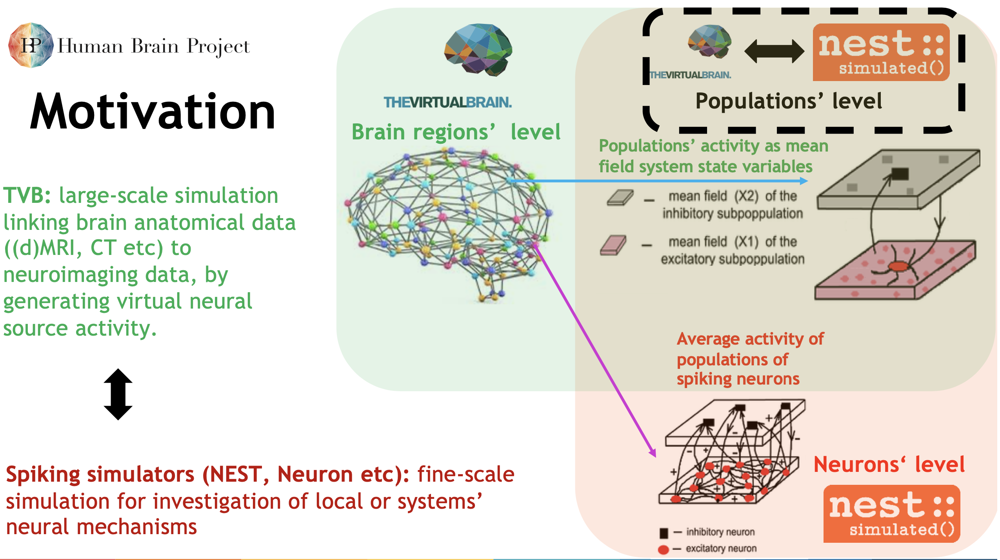

In [1]:
from IPython.core.display import Image, display
display(Image(filename='./pics/ConceptGraph1.png',  width=1000, unconfined=False))

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

# TVB - NEST co-simulation with Reduced Wong-Wang model

We demonstrate a multiscale simulation <br> of a reduced Wong-Wang model [3] <br> using TVB [1, 2] for brain region modelled at coarse scale, <br> and NEST [4] for regions modelled as <br> networks of spiking neural populations.

## Reduced Wong-Wang mean field model

For every region node $n\prime$ modelled as a mean-field node in TVB:

(Post)Synaptic gating dynamics (i.e., proportion of synapse channels open at any given time):

$\dot{S_{n\prime}}^{(E)} = - \frac{1}{\tau_E}{S_{n\prime}}^{(E)}(t) + (1-{S_{n\prime}}^{(E)}(t))\gamma_{E} {R_{n\prime}}^{(E)}(t)$

$\dot{S_{n\prime}}^{(I)} = - \frac{1}{\tau_I}{S_{n\prime}}^{(I)}(t) + \gamma_I{R_{n\prime}}^{(I)}(t)$

where we bound ${S_{n\prime}}^{(E/I)}(t) \in $ [0.0, 1.0], 

and $ {R_{n\prime}}^{(E/I)}(t) $ is the postsynaptic firing rate given by:

$ {R_{n\prime}}^{(E/I)}(t) = H({I_{syn_{n\prime}}}^{(E/I)}(t), a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) $

where

$ H({I_{syn_{n\prime}}}^{(E/I)}(t),  a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) = \frac{a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)}}{1-e^{-d_{(E/I)}(a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)})}}$ 

is a sigmoidal activation function of the input presynaptic current.

The total input presynaptic current to excitatory populations is given by: 

$ {I_{syn_{n\prime}}}^{(E)}(t) = W_EI_o + w_+J_{NMDA}{S_{n\prime}}^{(E)}(t) - J_{{n\prime}}{S_{n\prime}}^{(I)}(t) + GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

and to inhibitory ones:

$ {I_{syn_{n\prime}}}^{(I)}(t) = W_II_o + J_{NMDA}{S_{n\prime}}^{(E)}(t) - {S_{n\prime}}^{(I)}(t) +  \lambda GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

where 
$\lambda  \in$[0, 1] for scaling feedforward inhibition.

TVB connectivity weights $C_{{m\prime}{n\prime}}$ are scaled per "region"

## Reduced Wong-Wang mean field model

## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{{m\prime}{n\prime}}$ (${m\prime}->{n\prime}$)
- structural TVB connectivity delays $\tau_{{m\prime}{n\prime}}$  (${m\prime}->{n\prime}$)
- global structural brain connectivity coupling constant $G$
- overall effective external input current $I_o = 0.382nA$ 
- excitatory synaptic coupling $J_{NDMA} = 0.15nA$ 
- local feedback inhibitory synaptic coupling $J_{i} = 1.0nA$ 
- local excitatory recurrence $w_+ = 1.4$
- excitatory kinetic parameter $\gamma_E = 0.641 s$
- inhibitory kinetic parameter $\gamma_I = 1.0 s$
- excitatory (NMDA) time constant $\tau_E = \tau_{NMDA}=100ms$ 
- inhibitory (GABA) time constant $\tau_I = \tau_{GABA}=10ms$ 
- excitatory pool scaling constant $W_E = 1.0$
- inhibitory pool scaling constant $W_I = 0.7$
- excitatory sigmoidal functions parameters $a_{E} = 310nC^{-1}$, $b_{E} = 125Hz$, $d_{E} = 0.16s$
- inhibitory sigmoidal functions parameters $a_{I} = 615nC^{-1}$, $b_{I} = 177Hz$, $d_{I} = 0.087s$
- $\lambda = 1$, allowing for feedforward inhibition


## Spiking network model in NEST

For every neuron $i$ in region node $n$ modelled in NEST as a spiking network of "integrate and fire" neurons with alpha synapses:


$ C_m{\dot{V}_{ni}}^m = - {I_{ni}}^L(t) - {I_{ni}}^{ex}(t) - {I_{ni}}^{in}(t) + {I_{ni}}^{ext}(t) $

$\;\;\;\;\;\;\;\;\;\;=-g_L({V_{ni}}^m(t) - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-g_{ex_{ni}}({V_{ni}}^m(t) - V_{ex}) $

$\;\;\;\;\;\;\;\;\;\;\;-g_{in_{ni}}({V_{ni}}^m(t) - V_{in}) $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext}(t) $

$ \ddot{g}_{ex_{ni}} = -\frac{1}{\tau_{syn_{ex}}}\dot{g}_{ex_{ni}} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j<-E}$

$ \dot{g}_{ex_{ni}} = \dot{g}_{ex_{ni}} -\frac{g_{ex_{ni}}}{\tau_{syn_{ex}}}$

$ \ddot{g}_{in_{ni}} = -\frac{1}{\tau_{syn_{in}}}\dot{g}_{in_{ni}} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j<-I}$

$ \dot{g}_{in_{ni}} = \dot{g}_{in_{ni}} -\frac{g_{in_{ni}}}{\tau_{syn_{in}}}$

When $V_m(t) > V_{th}$, emit a spike and clamp $V_m(t)$ to $V_{reset}$ for $\tau_{ref}$ ms.


## TVB to NEST coupling
The term 

$ G\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n})$,

which is scaled by $\lambda$ for inhibitory neurons,

denotes possible inputs by NEST dc current generator devices that can play the role of TVB "proxy" nodes, i.e., mirroring their activity, where

$ I_{n\prime n,i}^{dc}(t) = N_EJ_{NMDA}{S_{n\prime}}^{(E)}(t) $

Similarly, $I_{ni}^{ext}(t)$ is an external current parameter that can be updated at each time step based on the TVB large-scale delayed coupling input towards region node n:

for excitatory neurons:

$I_{n,exc}^{ext}(t) = N_EGJ_{NMDA}\sum_{{n\prime} n}C_{{n\prime}}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

and for inhibitory ones:

$I_{n,inh}^{ext}(t) = N_E\lambda GJ_{NMDA}\sum_{{n\prime}n}C_{{n\prime}n}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

Instead, when TVB couples to NEST via instantaneous spike rate $ N_E{R_{n\prime}}^{(E/I)}(t) $, spike generator NEST devices are also used as TVB "proxy" nodes and generate spike trains 

$ \left[ \sum_k \delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime} $

Notice that all large-scale input is always scaled with the size of the excitatory population $ N_E $.

## NEST to TVB update

A NEST spike recorder device is used to count spike for each time step, and convert it to an instant population mean rate that overrides the TVB state variables $R_{n}^{E/I}$ after low pass filtering via a linear dynamical equation:

$ {\dot{R}_{n}}^{E/I}  = -\frac{1}{\tau_{{R_{in_{n}}}}^{E/I}}({R_{n}}^{E/I}(t) - {R_{in_{n}}}^{E/I}(t)) $

where:

$ {R_{in_{n}}}^{E/I}(t) =  \frac{\sum_j\left[ \sum_k \delta(t-\tau_n-{t_j}^k) \right]_{j \in (E/I)_n}}{N_{(E/I)}} $

and $ \tau_{R_{in_{n}}}^{E/I} = 1.0 ms $ by default


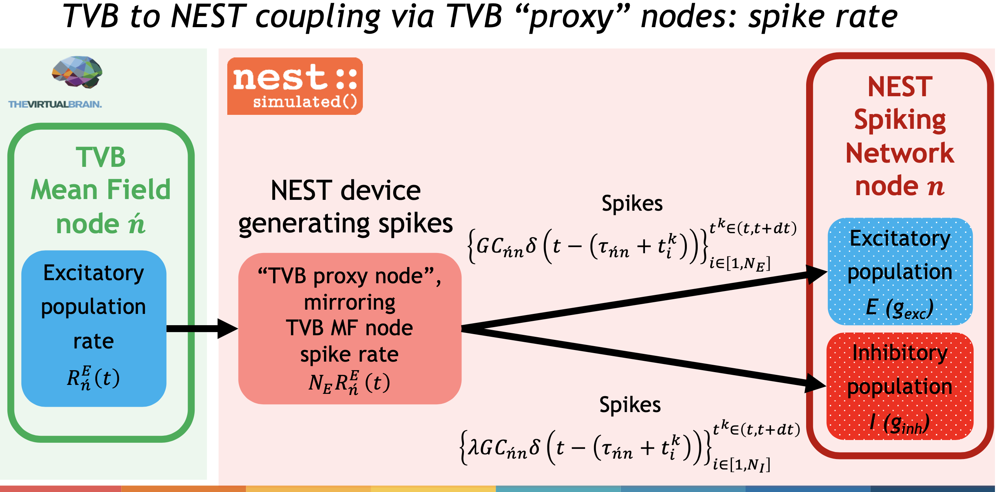

In [2]:
display(Image(filename='./pics/Rate.png',  width=1000, unconfined=False))

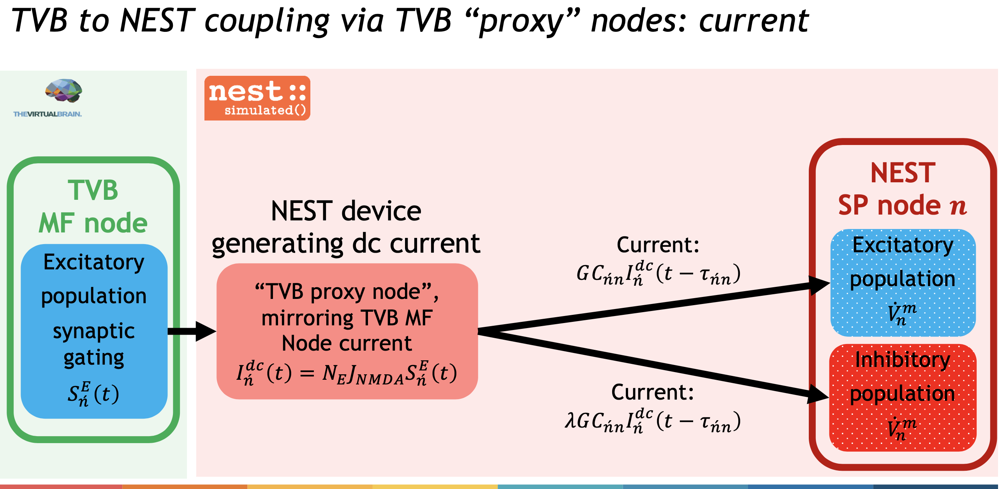

In [3]:
display(Image(filename='./pics/DC.png',  width=1000, unconfined=False))

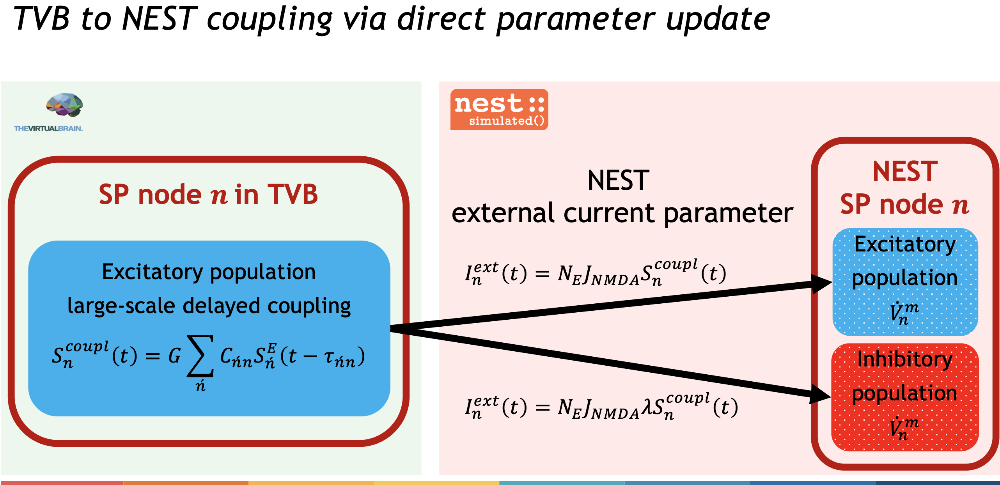

In [4]:
display(Image(filename='./pics/Ie.png',  width=1000, unconfined=False))

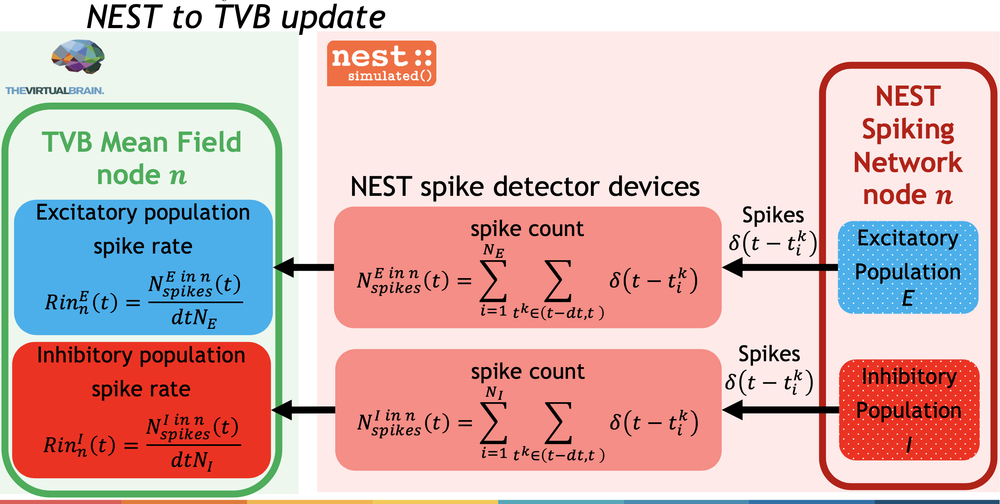

In [5]:
display(Image(filename='./pics/NESTtoTVB.png',  width=1000, unconfined=False))

# WORKFLOW:

In [6]:
import os
from collections import OrderedDict
import time
import numpy as np

from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

from tvb_multiscale.tvb_nest.config import *

work_path = os.getcwd()
outputs_path = os.path.join(work_path, "outputs/RedWongWang")
config = Config(output_base=outputs_path)

config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'
config.figures.DEFAULT_SIZE= config.figures.NOTEBOOK_SIZE
FIGSIZE = config.figures.DEFAULT_SIZE

from tvb_multiscale.core.plot.plotter import Plotter
plotter = Plotter(config.figures)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 


## 1. Load structural data <br> (minimally a TVB connectivity)  <br> & prepare TVB simulator  <br> (region mean field model, integrator, monitors etc)

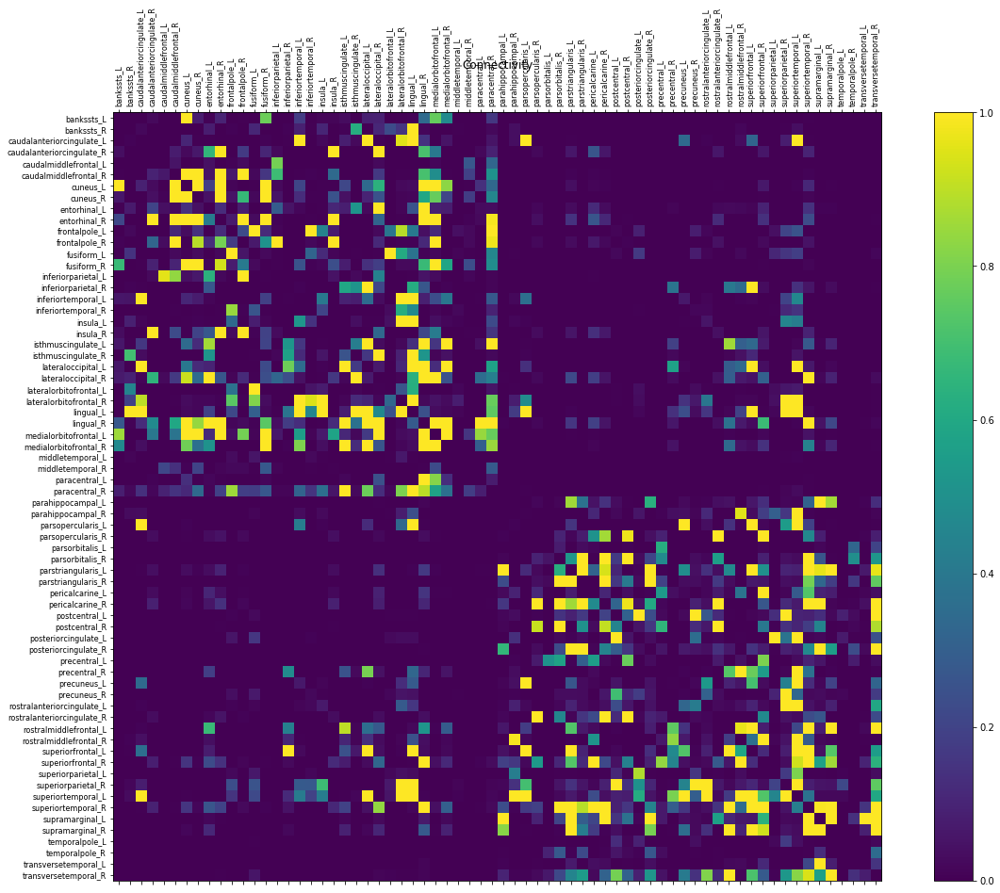

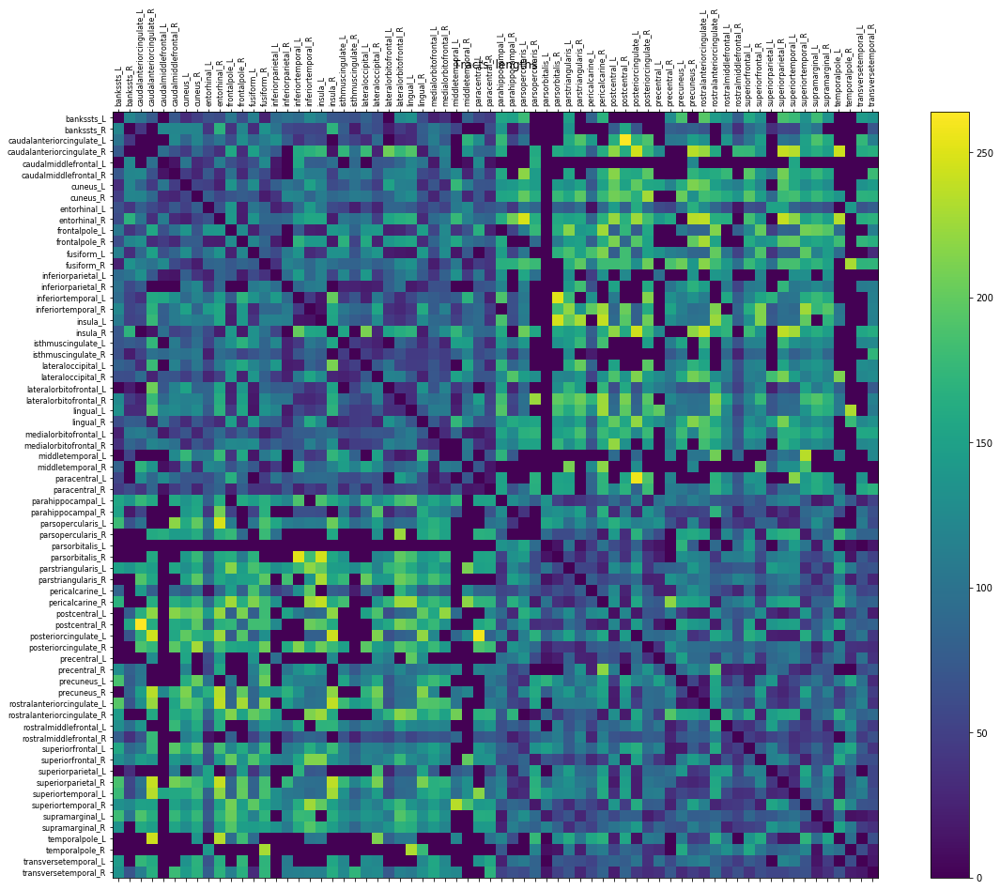

In [7]:
from tvb.simulator.models.reduced_wong_wang_exc_io_inh_i import ReducedWongWangExcIOInhI
from tvb_multiscale.core.tvb.simulator_builder import SimulatorBuilder



# ----------------------1. Build a TVB simulator (model, integrator, monitors...)----------------------------------
simulator_builder = SimulatorBuilder()
simulator_builder.connectivity = config.DEFAULT_CONNECTIVITY_ZIP
simulator_builder.model = ReducedWongWangExcIOInhI
model_params = {"G": np.array([20.0, ]), "J_i": np.array([1.0, ]), "lamda": np.array([0.0, ])}
simulator = simulator_builder.build(**model_params)


# Optionally modify the default configuration:

# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the simulator by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

# from tvb.datatypes.connectivity import Connectivity
# from tvb.simulator.cosimulator import CoSimulator
# from tvb.simulator.integrators import HeunStochastic
# from tvb.simulator.monitors import Raw  # , Bold, EEG
    
# # Load connectivity
# connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)
# # Normalize connectivity weights
# connectivity.weights = connectivity.scaled_weights(mode="region")
# connectivity.weights /= np.percentile(connectivity.weights, 95)
# connectivity.weights[connectivity.weights>1.0] = 1.0
# connectivity.configure()

# # Create a TVB simulator and set all desired inputs
# # (connectivity, model, surface, stimuli etc)
# # We choose all defaults in this example
# simulator = Simulator()
# simulator.model = ReducedWongWangExcIOInhI()
# # simulator.model.G = np.array([20.0, ])     # Global cloupling scaling
# # simulator.model.J_i = np.array([1.0, ])   # Feedback inhibition
# # simulator.model.lamda = np.array([0.0, ]) # Feedforward inhibition

# simulator.connectivity = connectivity

# simulator.integrator = HeunStochastic()
# simulator.integrator.dt = 0.1
# simulator.integrator.noise.nsig = np.array([0.001])

# mon_raw = Raw(period=1.0)  # ms
# simulator.monitors = (mon_raw, )

# # ----------------------------------------------------------------------------------------------------------------
# # ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# # ----------------------------------------------------------------------------------------------------------------

plotter.plot_tvb_connectivity(simulator.connectivity);


## 2. Build and connect the NEST network model <br> (networks of spiking neural populations for fine-scale <br>regions, stimulation devices, spike recorders etc)

In [8]:
# Select the regions for the fine scale modeling with NEST spiking networks
number_of_regions = simulator.connectivity.region_labels.shape[0]
nest_nodes_ids = []  # the indices of fine scale regions modeled with NEST
# We model parahippocampal cortices (left and right) with NEST
for id in range(number_of_regions):
    if simulator.connectivity.region_labels[id].find("hippo") > 0:
        nest_nodes_ids.append(id)
        
from tvb_multiscale.tvb_nest.nest_models.builders.models.default_exc_io_inh_i import DefaultExcIOInhIBuilder

# Build a NEST network model with the corresponding builder
nest_model_builder = DefaultExcIOInhIBuilder(simulator, nest_nodes_ids, config=config, set_defaults=False)

N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)

nest_model_builder.global_coupling_scaling = \
    nest_model_builder.tvb_simulator.coupling.a[0].item() * nest_model_builder.tvb_model.G[0].item()
nest_model_builder.lamda = nest_model_builder.tvb_model.lamda[0].item()

# # Using all default parameters for this example
nest_model_builder.set_defaults()

# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------
from copy import deepcopy

population_neuron_model = "iaf_cond_alpha"

nest_model_builder.population_order = 100

nest_model_builder.scale_e = 1.0
nest_model_builder.scale_i = 1.0

N_E = int(nest_model_builder.population_order * nest_model_builder.scale_e)
N_I = int(nest_model_builder.population_order * nest_model_builder.scale_i)


# Populations' configurations
# When any of the properties 
# model, params and scale below depends on regions,
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property
nest_model_builder.populations = [
    {"label": "E", "model": population_neuron_model,
     "nodes": None,  # None means "all"
     "params": {},
     "scale": nest_model_builder.scale_e},
    {"label": "I", "model": population_neuron_model,
     "nodes": None,  # None means "all"
     "params": {},
     "scale": nest_model_builder.scale_i}
  ]

# Within region-node connections
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property
synapse_model = "static_synapse"
conn_spec = {"allow_autapses": True, 'allow_multapses': True, 'rule': "all_to_all",
             "indegree": None, "outdegree": None, "N": None, "p": 0.1}

from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates import \
    random_normal_weight, random_uniform_tvb_delay

w_ee = 1.0  # random_normal_weight(1.0, sigma=0.1) # {"distribution": "normal", "mu": 1.0, "sigma": 0.1}
w_ii = -1.0 # random_normal_weight(-1.0, sigma=0.1) # {"distribution": "normal", "mu": -1.0, "sigma": 0.1}

within_node_delay = nest_model_builder.default_min_delay
#                     {"distribution": "uniform", 
#                      "low": np.minimum(nest_model_builder.default_min_delay, 
#                                        nest_model_builder.default_populations_connection["delay"]), 
#                      "high": np.maximum(nest_model_builder.tvb_dt, 
#                                         2*nest_model_builder.default_populations_connection["delay"])}

nest_model_builder.populations_connections = [
     #              ->
    {"source": "E", "target": "E",  # E -> E This is a self-connection for population "E"
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": w_ee, "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  # None means apply to all
    {"source": "E", "target": "I",  # E -> I
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": w_ee, "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  # None means apply to all
    {"source": "I", "target": "E",  # I -> E
     "synapse_model": synapse_model, "conn_spec": conn_spec, 
     "weight": w_ii, "delay": within_node_delay,
     "receptor_type": 0, "nodes": None},  # None means apply to all
    {"source": "I", "target": "I",  # I -> I This is a self-connection for population "I"
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": w_ii, "delay": within_node_delay,
     "receptor_type": 0, "nodes": None}  # None means apply to all
    ]


# Among/Between region-node connections
# Given that only the AMPA population of one region-node couples to
# all populations of another region-node,
# we need only one connection type
        
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# depends on regions, set a handle to a function with
# arguments (source_region_index=None, target_region_index=None)

from tvb_multiscale.core.spiking_models.builders.templates import \
    scale_tvb_weight, tvb_delay
from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates import \
    random_normal_tvb_weight, random_uniform_tvb_delay
    
lamda = nest_model_builder.tvb_model.lamda[0]

tvb_weight_fun = lambda source_node, target_node: \
    scale_tvb_weight(source_node, target_node, 
                     nest_model_builder.tvb_weights, 
                     scale=nest_model_builder.global_coupling_scaling)
#     random_normal_tvb_weight(source_node, target_node, 
#                      nest_model_builder.tvb_weights, 
#                      scale=nest_model_builder.global_coupling_scaling, 
#                      sigma=0.1)
tvb_delay_fun = lambda source_node, target_node: \
                 tvb_delay(source_node, target_node, nest_model_builder.tvb_delays)
#                  random_uniform_tvb_delay(source_node, target_node, nest_model_builder.tvb_delays, 
#                                           low=nest_model_builder.tvb_dt, 
#                                           high=2*nest_model_builder.tvb_dt, 
#                                           sigma=0.1)

receptor_by_source_region = lambda source_node, target_node: int(source_node + 1)

# Total excitatory spikes of one region node will be distributed to
nest_model_builder.nodes_connections = [
    #              ->
    {"source": "E", "target": ["E"],
     "synapse_model": synapse_model, "conn_spec": conn_spec,
     "weight": tvb_weight_fun, "delay": tvb_delay_fun, "receptor_type": 0,
     "source_nodes": None, "target_nodes": None}  # None means apply to all
    ]

if lamda > 0:
    nest_model_builder.nodes_connections.append(
        {"source": "E", "target": ["I"],
         "synapse_model": synapse_model, "conn_spec": conn_spec,
         "weight": tvb_weight_fun, "delay": tvb_delay_fun, "receptor_type": 0,
         "source_nodes": None, "target_nodes": None}  # None means apply to all
    )
    
    
# Creating  devices to be able to observe NEST activity:

nest_model_builder.output_devices = []

connections = OrderedDict({})
#          label <- target population
connections["E_spikes"] = "E"
connections["I_spikes"] = "I"
nest_model_builder.output_devices.append(
    {"model": "spike_recorder", "params": {"record_to": "memory"}, # ascii
     "connections": connections, "nodes": None})  # None means apply to all

# Labels have to be different

connections = OrderedDict({})
#               label    <- target population
connections["E"] = "E"
connections["I"] = "I"
record_from = ["V_m", "g_ex", "g_in"]
params = {"interval": 1.0, 'record_from': record_from, "record_to": "memory"}  # ms
nest_model_builder.output_devices.append(
    {"model": "multimeter", "params": params,
     "connections": connections, "nodes": None})  # None means apply to all
    

# Create a spike stimulus input device
nest_model_builder.input_devices = [
    {"model": "poisson_generator",
     "params": {"rate": 10000.0, "origin": 0.0, "start": 0.1},  # "stop": 100.0
     "connections": {"Stimulus": ["E", "I"]}, 
     "nodes": None,         # None means apply to all
     "weights": 1.0, 
     "delays": nest_model_builder.tvb_dt, 
#      {"distribution": "uniform", 
#       "low": nest_model_builder.tvb_dt, 
#       "high": 2*nest_model_builder.tvb_dt},
     "receptor_type": 0}
                                  ]  #

# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_network = nest_model_builder.build_spiking_network()



2020-12-22 22:23:58,743 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-12-22 22:23:58,743 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-12-22 22:23:58,745 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-12-22 22:23:58,745 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-12-22 22:23:58,748 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-12-22 22:23:58,748 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-12-22 22:23:58,751 - INFO - tvb_multiscale.tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2020-12-22 22:23:58,751 - INFO - tvb_multiscale.t

2020-12-22 22:23:58,959 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for E_spikes created!
2020-12-22 22:23:58,959 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for E_spikes created!
2020-12-22 22:23:59,020 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for I_spikes created!
2020-12-22 22:23:59,020 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model spike_recorder for I_spikes created!
2020-12-22 22:23:59,080 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model multimeter for E created!
2020-12-22 22:23:59,080 - INFO - tvb_multiscale.core.spiking_models.devices 

In [9]:
print(nest_network.print_str(connectivity=True))


----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
NESTNetwork:

----------------------------------------------------------------------------------------------------

SpikingBrain - Regions: ['parahippocampal_L', 'parahippocampal_R']
Regions' nodes:


----------------------------------------------------------------------------------------------------
NESTRegionNode - Label: parahippocampal_L
Populations ['E', 'I']:

----------------------------------------------------------------------------------------------------

NESTPopulation - Label: E 
model: iaf_cond_alpha
100 neurons: 1...100
parameters: {'archiver_length': 0, 'beta_Ca': array([0.001]), 'C_m': array([250.]), 'Ca': array([0.]), 'dg_ex': array([0.]), 'dg_in': array([0.]), 'E_L':

## 3. Build the TVB-NEST interface

In [10]:
from tvb_multiscale.tvb_nest.interfaces.builders.models.default import DefaultInterfaceBuilder 

# Build a TVB-NEST interface with all the appropriate connections between the
# TVB and NEST modelled regions
tvb_nest_builder = \
    DefaultInterfaceBuilder(simulator, nest_network, nest_nodes_ids, 
                            exclusive_nodes=True, populations_sizes=[N_E, N_I])


tvb_to_nest_mode = "rate" # "rate", "current", "param"
nest_to_tvb=True

# Using all default parameters for this example

# or...


from tvb_multiscale.core.spiking_models.builders.templates import tvb_delay, scale_tvb_weight
from tvb_multiscale.tvb_nest.nest_models.builders.nest_templates \
    import random_normal_tvb_weight, random_uniform_tvb_delay

lamda = tvb_nest_builder.tvb_model.lamda[0].item()
tvb_nest_builder.global_coupling_scaling = nest_model_builder.global_coupling_scaling



# TVB -> NEST

if tvb_to_nest_mode in ["rate", "current"]:
    
    tvb_weight_fun = lambda tvb_node_id, nest_node_id: \
                        scale_tvb_weight(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_weights, 
                                        scale=nest_model_builder.global_coupling_scaling)
#                         random_normal_tvb_weight(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_weights,
#                                                  scale=nest_model_builder.global_coupling_scaling,
#                                                  sigma=0.1)



    tvb_delay_fun = lambda tvb_node_id, nest_node_id: \
                        tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays)
#                         random_uniform_tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays,
#                                                  low=tvb_nest_builder.tvb_dt, 
#                                                  high=2*tvb_nest_builder.tvb_dt,
#                                                  sigma=0.1)



# --------For spike transmission from TVB to NEST devices acting as TVB proxy nodes with TVB delays:--------

# Mean spike rates are applied in parallel to all target neurons

if tvb_to_nest_mode == "rate":
    
    tvb_nest_builder.tvb_to_spikeNet_interfaces = [
        {"model": "inhomogeneous_poisson_generator",
         "params": {"allow_offgrid_times": False},
    # # ---------Properties potentially set as function handles with args (tvb_node_id=None)-------------------------
         "interface_weights": 1.0 * N_E, # Convert mean value to total value
    # Applied outside NEST for each interface device
    # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
        "weights": tvb_weight_fun, "delays": tvb_delay_fun, "receptor_type": 0,
        # --------------------------------------------------------------------------------------------------------------
        #             TVB sv -> NEST population
        "connections": {"R_e": ["E"]},
        "source_nodes": None, "target_nodes": None}]  # None means all here

    if lamda > 0.0:
        tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
            {"model": "inhomogeneous_poisson_generator",
             "params": {"allow_offgrid_times": False},
        # # ---------Properties potentially set as function handles with args (tvb_node_id=None)-------------------------
             "interface_weights": lamda * N_E, # Convert mean value to total value
        # Applied outside NEST for each interface device
        # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
            "weights": tvb_weight_fun, "delays": tvb_delay_fun, "receptor_type": 0,
            # --------------------------------------------------------------------------------------------------------------
            #             TVB sv -> NEST population
            "connections": {"R_e": ["I"]},
            "source_nodes": None, "target_nodes": None
            }
        )


    
# Mean currents are distributed to all target neurons


if tvb_to_nest_mode == "current":

    # --For injecting current to NEST neurons via dc generators acting as TVB proxy nodes with TVB delays:--

    tvb_nest_builder.tvb_to_spikeNet_interfaces = [
        {"model": "dc_generator", "params": {},
    # Properties potentially set as function handles with args (tvb_node_id=None)
    #   Applied outside NEST for each interface device
         "interface_weights": 1.0,  # N_E / N_E
    # Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)
         "weights": tvb_weight_fun, "delays": tvb_delay_fun,
    #                   TVB sv -> NEST population
         "connections": {"S_e": ["E"]},
         "source_nodes": None, "target_nodes": None}]  # None means all here

    if lamda > 0.0:
        tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
           {"model": "dc_generator", "params": {},
        # ---------Properties potentially set as function handles with args (tvb_node_id=None)
        #   Applied outside NEST for each interface device
             "interface_weights": lamda*N_E / N_I,
        # Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)
             "weights": tvb_weight_fun, "delays": tvb_delay_fun,
        #                  TVB sv -> NEST population
             "connections": {"S_e": ["I"]},
             "source_nodes": None, "target_nodes": None}
        )


if tvb_to_nest_mode == "param":

    # --For directly setting an external current parameter in NEST neurons instantaneously:--
    tvb_nest_builder.tvb_to_spikeNet_interfaces = [
        {"model": "current",  "parameter": "I_e",
    # Properties potentially set as function handles with args (tvb_node_id=None)
         "interface_weights": 1.0,  # N_E / N_E
    #                  TVB sv -> NEST population
         "connections": {"S_e": ["E"]},
         "nodes": None}]  # None means all here
    if lamda > 0.0:
        # Coupling to inhibitory populations as well (feedforward inhibition):
        tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
        {
            "model": "current", "parameter": "I_e",
    # Properties potentially set as function handles with args (tvb_node_id=None)
            "interface_weights": lamda * N_E / N_I,
    #                     TVB sv -> NEST population
            "connections": {"S_e": ["I"]},
            "nodes": None}
    )

    

if nest_to_tvb:
    # NEST -> TVB:
    # Use S_e and S_i instead of r_e and r_i
    # for transmitting to the TVB state variables directly
    connections = OrderedDict()
    #            TVB <- NEST
    connections["Rin_e"] = ["E"]
    connections["Rin_i"] = ["I"]
    tvb_nest_builder.spikeNet_to_tvb_interfaces = [
        {"model": "spike_recorder", "params": {},
    # ----Properties potentially set as function handles with args (nest_node_id=None)--
         "interface_weights": 1.0, "delays": 0.0,
    # ---------------------------------------------------------------------------------
         "connections": connections, "nodes": None}]  # None means all here

    
tvb_nest_builder.w_tvb_to_current = 1000 * tvb_nest_builder.tvb_model.J_N[0]  # (nA of TVB -> pA of NEST)
# WongWang model parameter r is in Hz, just like poisson_generator assumes in NEST:
tvb_nest_builder.w_tvb_to_spike_rate = 1.0
# We return from a NEST spike_detector the ratio number_of_population_spikes / number_of_population_neurons
# for every TVB time step, which is usually a quantity in the range [0.0, 1.0],
# as long as a neuron cannot fire twice during a TVB time step, i.e.,
# as long as the TVB time step (usually 0.001 to 0.1 ms)
# is smaller than the neurons' refractory time, t_ref (usually 1-2 ms)
# For conversion to a rate, one has to do:
# w_spikes_to_tvb = 1/tvb_dt, to get it in spikes/ms, and
# w_spikes_to_tvb = 1000/tvb_dt, to get it in Hz
# given WongWang model parameter r is in Hz but tvb dt is in ms:
tvb_nest_builder.w_spikes_to_tvb = 1000.0 / tvb_nest_builder.tvb_dt
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

tvb_nest_model = tvb_nest_builder.build_interface(tvb_to_nest_mode=tvb_to_nest_mode, nest_to_tvb=nest_to_tvb)


2020-12-22 22:24:14,457 - INFO - tvb_multiscale.core.interfaces.base - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-12-22 22:24:14,457 - INFO - tvb_multiscale.core.interfaces.base - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-12-22 22:24:14,460 - INFO - tvb_multiscale.tvb_nest.interfaces.models - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-12-22 22:24:14,460 - INFO - tvb_multiscale.tvb_nest.interfaces.models - <class 'tvb_multiscale.tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2020-12-22 22:24:14,469 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
2020-12-22 22:24:14,469 - INFO - tvb_multiscale.core.spiking_models.devices - <class 'tvb_multiscale.core.spiking_models.devices.DeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
20

In [11]:
print(tvb_nest_model.print_str(detailed_output=True, connectivity=False))


----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
RedWWexcIOinhI TVB-NEST Interface


----------------------------------------------------------------------------------------------------


TVB to spikeNet interfaces:

----------------------------------------------------------------------------------------------------

Index: 0_R_e->['E']

TVBtoNESTInhomogeneousPoissonGeneratorInterface
Name: R_e, TVB state variable indice: 2, 
Interface weights: [100.0]
Source TVB nodes' indices:
0...33, 36...67 
Target NEST nodes' indices:
34...35 
TVBtoNESTInhomogeneousPoissonGeneratorInterface - Name: R_e, Model: inhomogeneous_poisson_generator,
Devices:
-----------------------------------------------------------------------------------------------

## 4. Configure simulator, simulate, gather results

In [12]:
# Configure the simulator with the TVB-NEST interface...
simulator.configure(tvb_spikeNet_interface=tvb_nest_model)
# ...and simulate!
t = time.time()
simulation_length=110.0  # Set at least 1100.0 for a meaningful simulation
transient = simulation_length/11
results = simulator.run(simulation_length=simulation_length)
# Integrate NEST one more NEST time step so that multimeters get the last time point
# unless you plan to continue simulation later
simulator.run_spiking_simulator(simulator.tvb_spikeNet_interface.nest_instance.GetKernelStatus("resolution"))
print("\nSimulated in %f secs!" % (time.time() - t))

2020-12-22 22:24:15,691 - INFO - tvb.simulator.cosimulator - Region simulation with 68 ROI nodes
2020-12-22 22:24:15,695 - INFO - tvb.simulator.cosimulator - Memory requirement estimate: simulation will need about 8.9 MB
2020-12-22 22:24:15,698 - INFO - tvb.simulator.cosimulator - Preparing initial history of shape (880, 8, 68, 1) using model.initial()
2020-12-22 22:24:15,778 - INFO - tvb.simulator.cosimulator - Final initial history shape is (880, 8, 68, 1)
2020-12-22 22:24:15,781 - INFO - tvb.simulator.cosimulator - Memory requirement census: simulation will need about 1.0 MB
2020-12-22 22:24:15,783 - INFO - tvb.simulator.cosimulator - Simulation runtime should be about 3.931 seconds
2020-12-22 22:24:15,784 - INFO - tvb.simulator.cosimulator - Calculating storage requirement for ...
2020-12-22 22:24:15,785 - INFO - tvb.simulator.cosimulator - Calculated storage requirement for simulation: 5385600 
...10.0% done in 3.1 sec- INFO - tvb.simulator.cosimulator - 
...20.0% done in 6.2 sec-

In [13]:
# Clean-up NEST simulation
simulator.tvb_spikeNet_interface.nest_instance.Cleanup()

## 5. Plot results and write them to HDF5 files

In [14]:
# set to False for faster plotting of only mean field variables and dates, apart from spikes" rasters:
plot_per_neuron = True 
MAX_VARS_IN_COLS = 3
MAX_REGIONS_IN_ROWS = 10
MIN_REGIONS_FOR_RASTER_PLOT = 9
# from examples.plot_write_results import plot_write_results
# populations = []
# populations_sizes = []
# for pop in nest_model_builder.populations:
#     populations.append(pop["label"])
#     populations_sizes.append(int(np.round(pop["scale"] * nest_model_builder.population_order)))
# plot_write_results(results, simulator, populations=populations, populations_sizes=populations_sizes, 
#                    transient=transient, tvb_state_variable_type_label="State Variables", 
#                    tvb_state_variables_labels=simulator.model.variables_of_interest, 
#                    plot_per_neuron=plot_per_neuron, plotter=plotter, config=config)

In [15]:
# If you want to see what the function above does, take the steps, one by one
try:
    # We need framework_tvb for writing and reading from HDF5 files
    from tvb_multiscale.core.io.h5_writer import H5Writer
    writer = H5Writer()
except:
    writer = False
    
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion
from tvb.contrib.scripts.datatypes.time_series_xarray import TimeSeriesRegion as TimeSeriesXarray

# Put the results in a Timeseries instance
from tvb.contrib.scripts.datatypes.time_series import TimeSeriesRegion

source_ts = TimeSeriesXarray(  # substitute with TimeSeriesRegion fot TVB like functionality
        data=results[0][1], time=results[0][0],
        connectivity=simulator.connectivity,
        labels_ordering=["Time", "State Variable", "Region", "Neurons"],
        labels_dimensions={"State Variable": list(simulator.model.variables_of_interest),
                           "Region": simulator.connectivity.region_labels.tolist()},
        sample_period=simulator.integrator.dt)
source_ts.configure()

t = source_ts.time
    
# Write to file
if writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(source_ts._data,
                                                                    connectivity=source_ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, source_ts.title)+".h5")
source_ts

,value
Dimensions,"['Time', 'State Variable', 'Region', 'Neurons']"
Length,1100
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: 53f40774-e64d-4bea-9107-564d75ba4cc3
Time units,ms
Time-series name,Region Time Series
Time-series type,TimeSeriesRegion
"[min, median, max]","[-0.713882, 0.224214, 3100]"


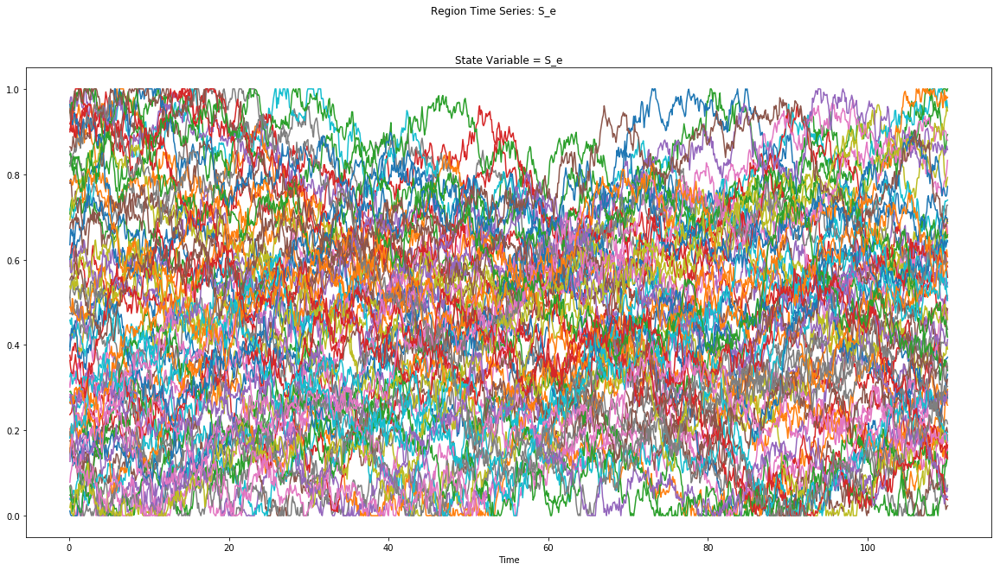

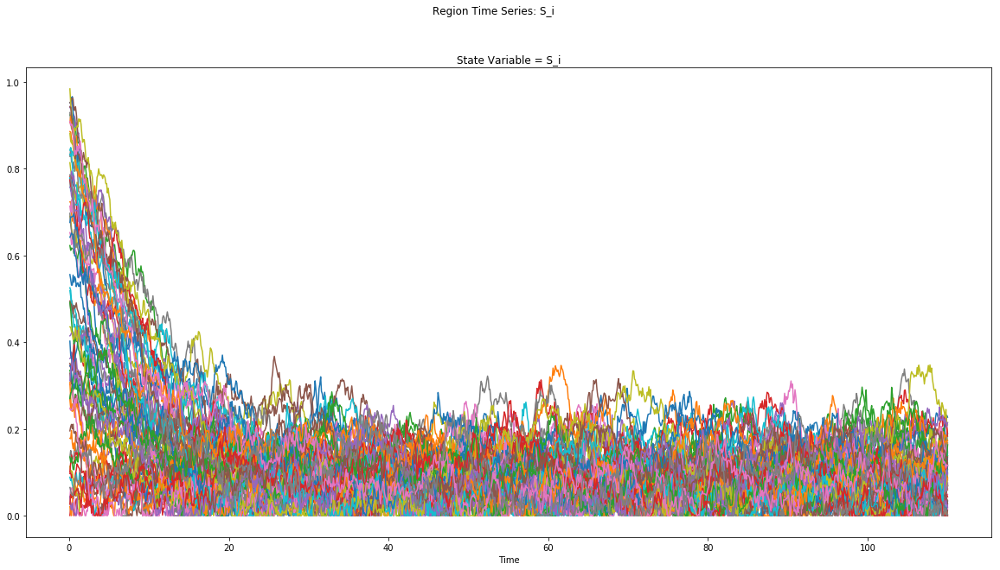

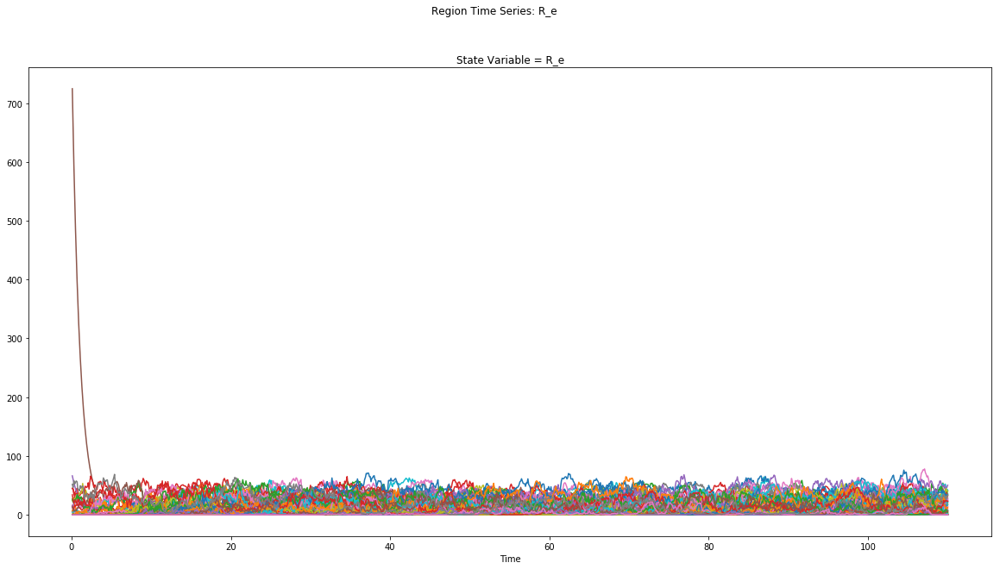

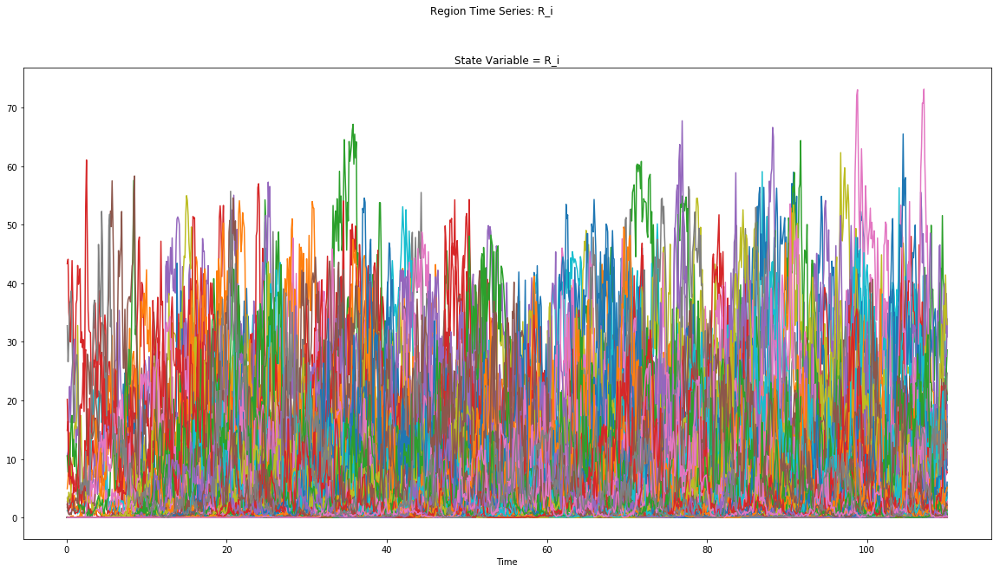

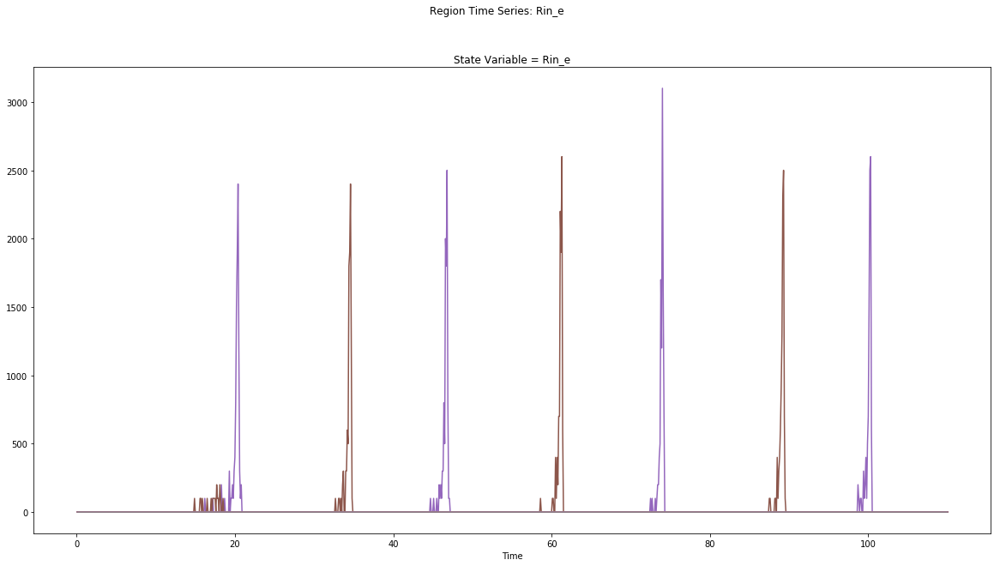

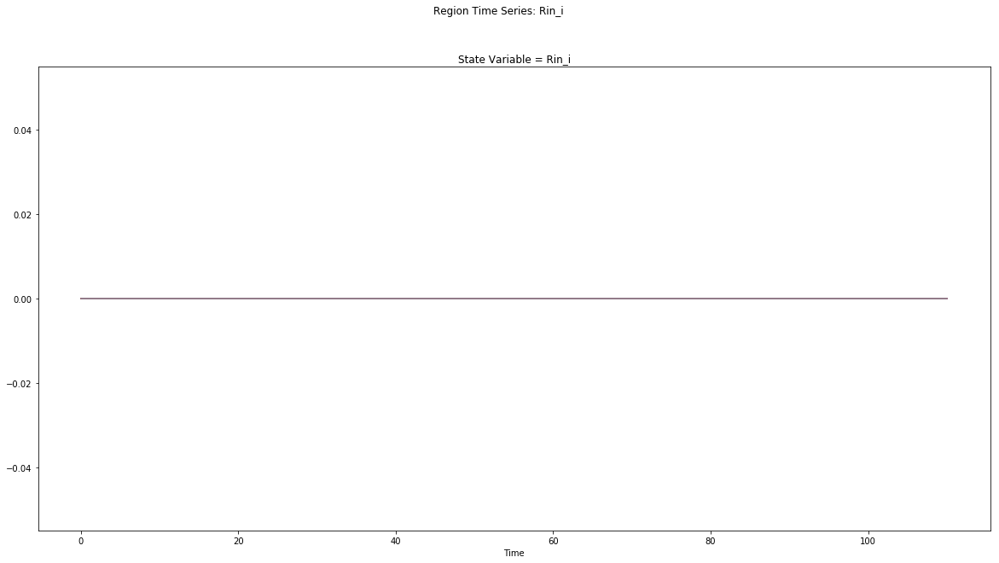

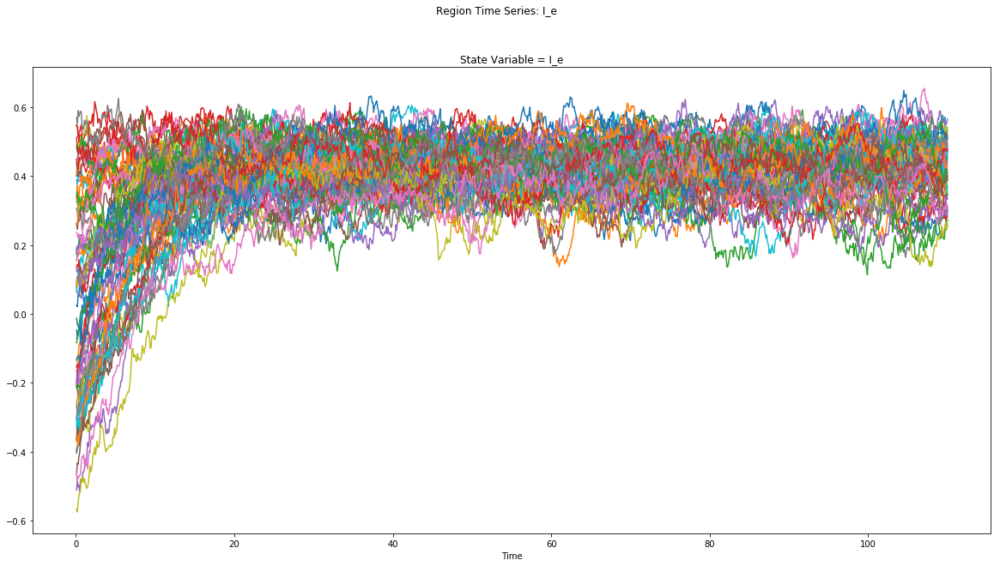

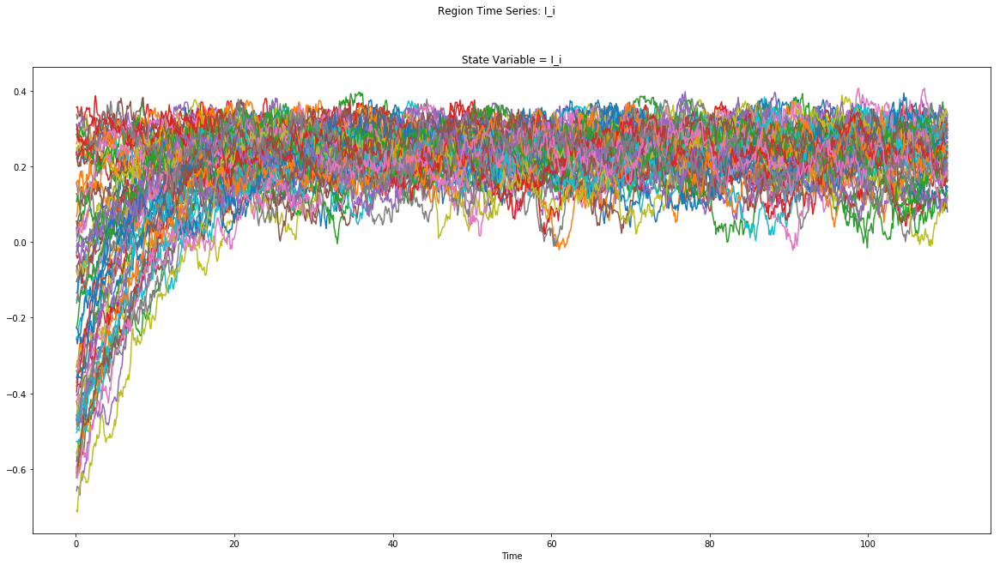

In [16]:
# Plot TVB time series
source_ts.plot_timeseries(plotter_config=plotter.config, 
                          hue="Region" if source_ts.shape[2] > MAX_REGIONS_IN_ROWS else None, 
                          per_variable=source_ts.shape[1] > MAX_VARS_IN_COLS, 
                          figsize=FIGSIZE);

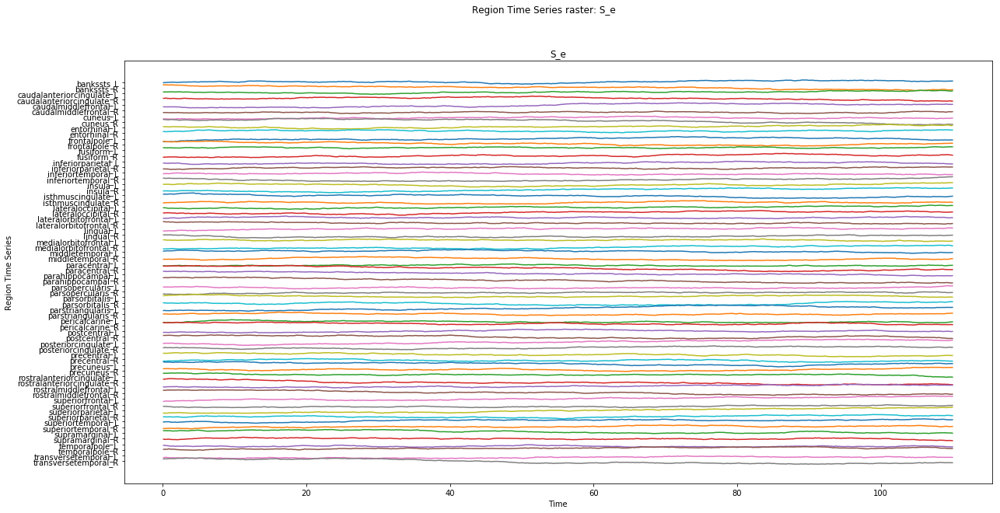

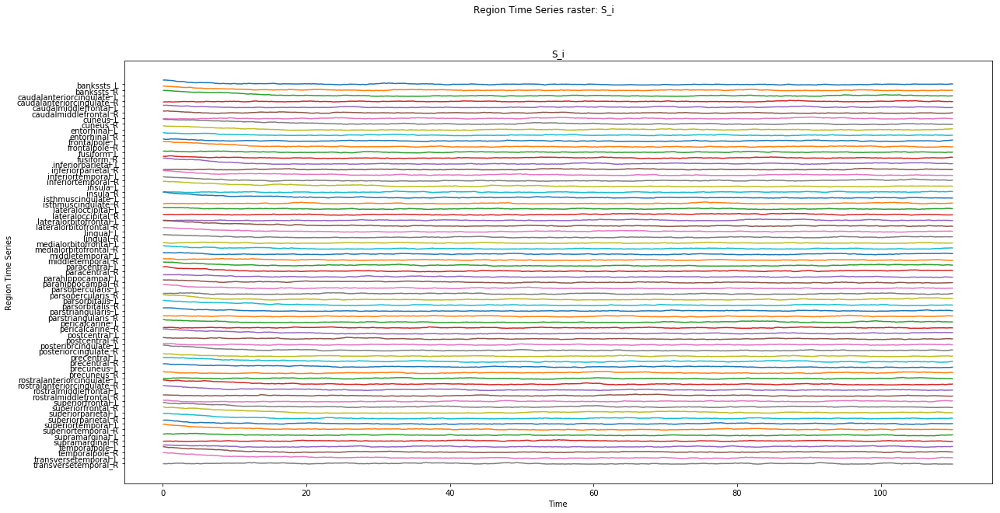

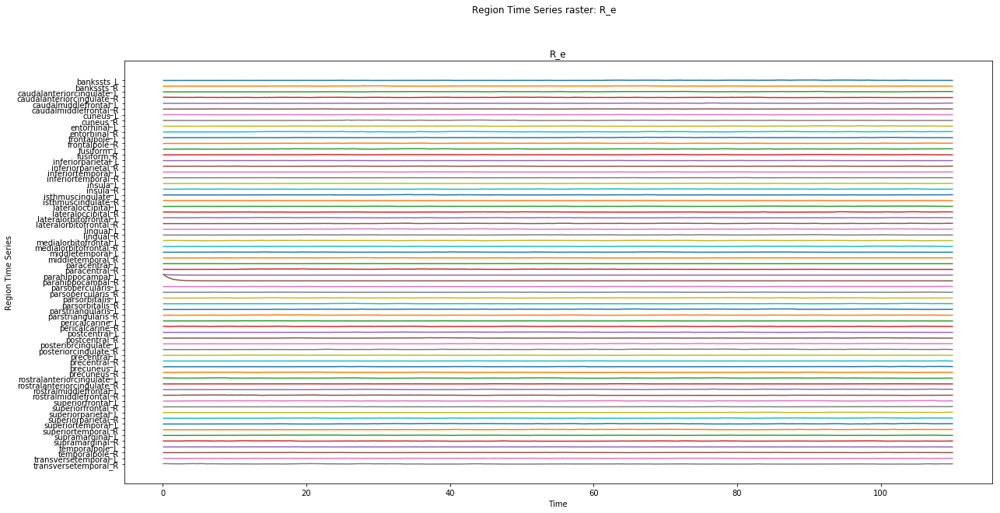

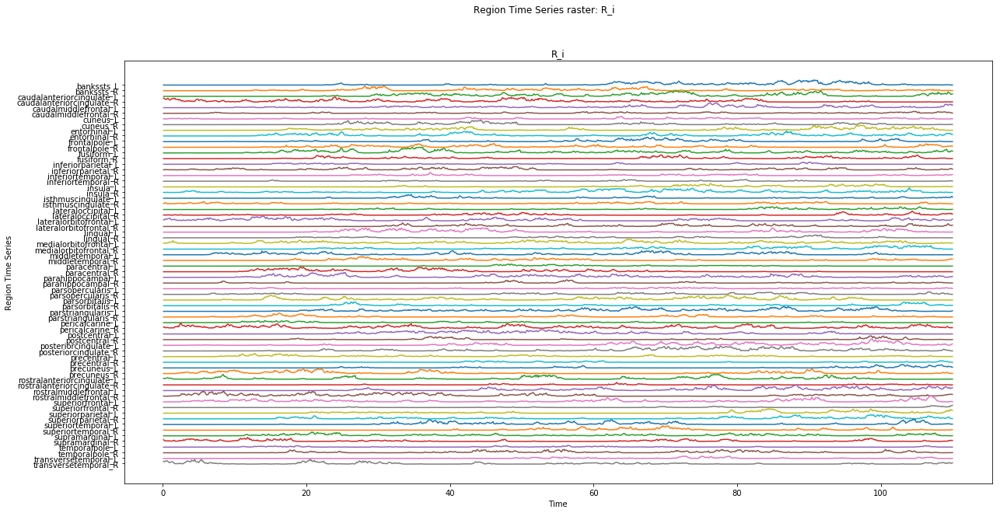

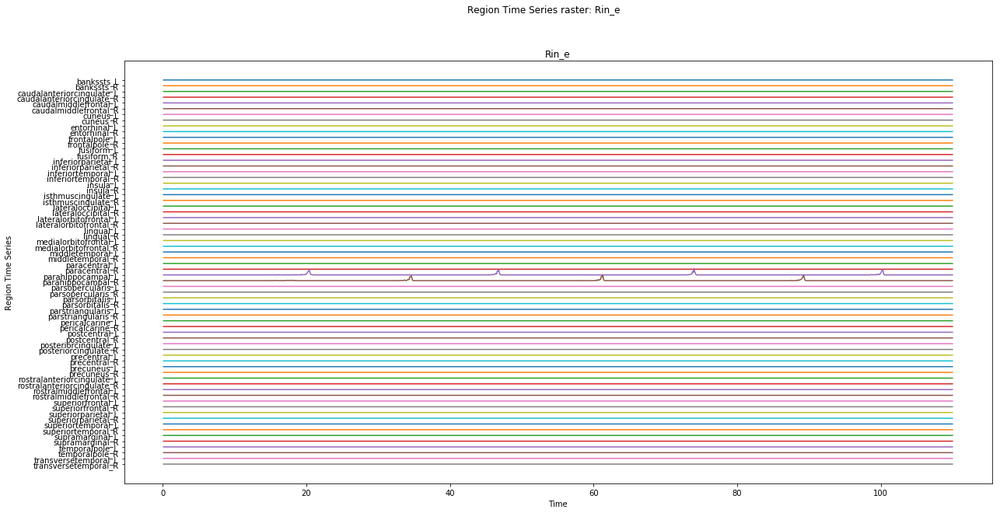

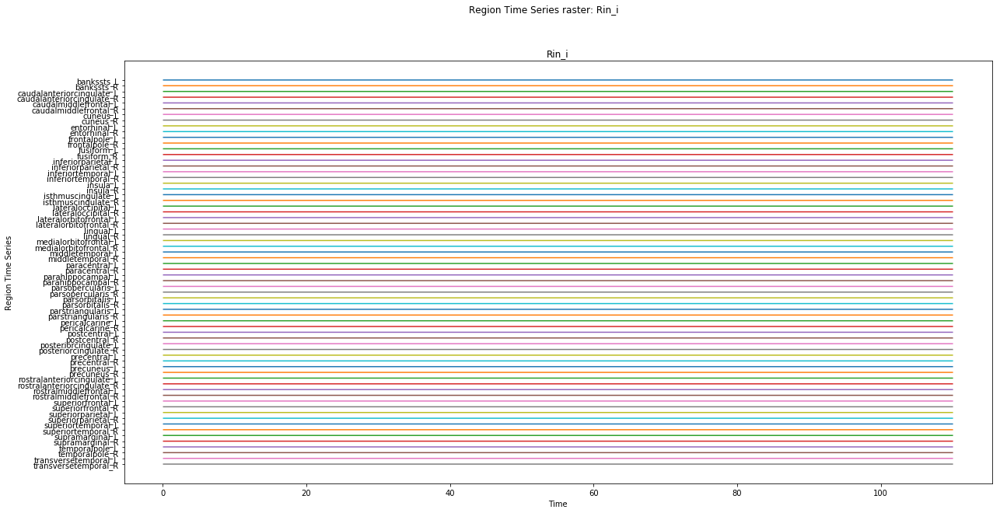

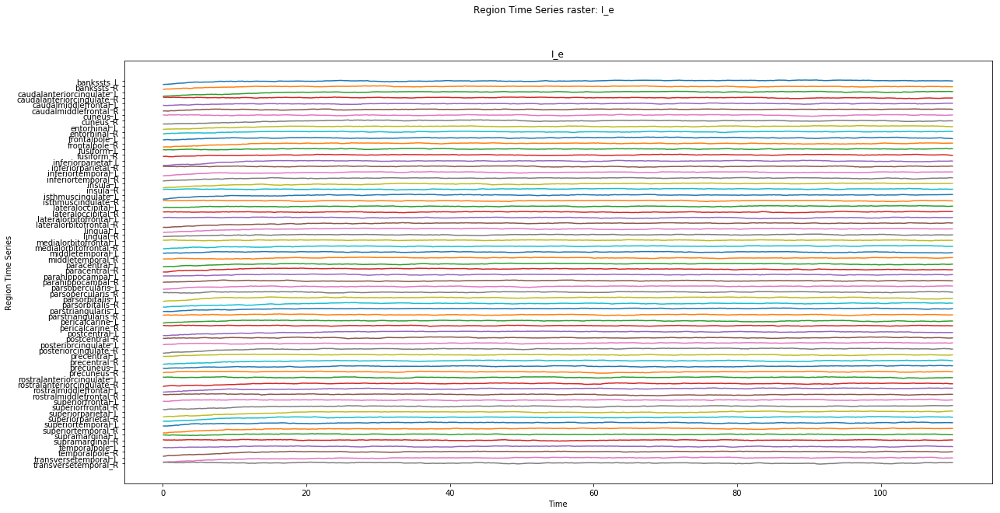

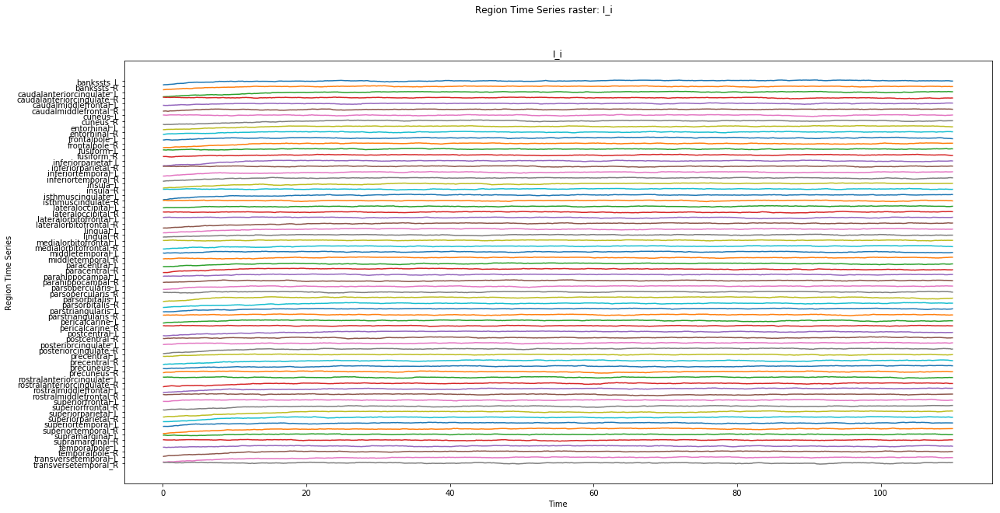

In [17]:
# TVB time series raster plot:
if source_ts.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
    source_ts.plot_raster(plotter_config=plotter.config, 
                          per_variable=source_ts.shape[1] > MAX_VARS_IN_COLS,
                          figsize=FIGSIZE);

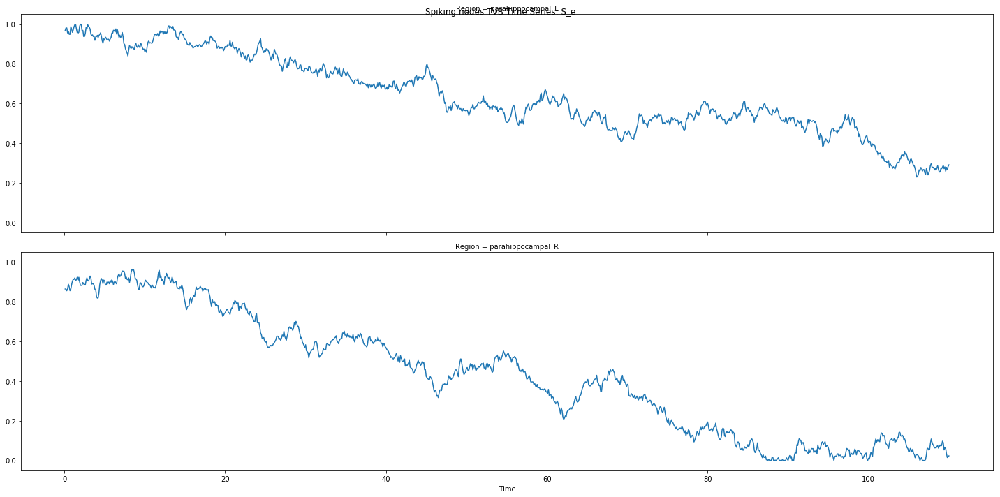

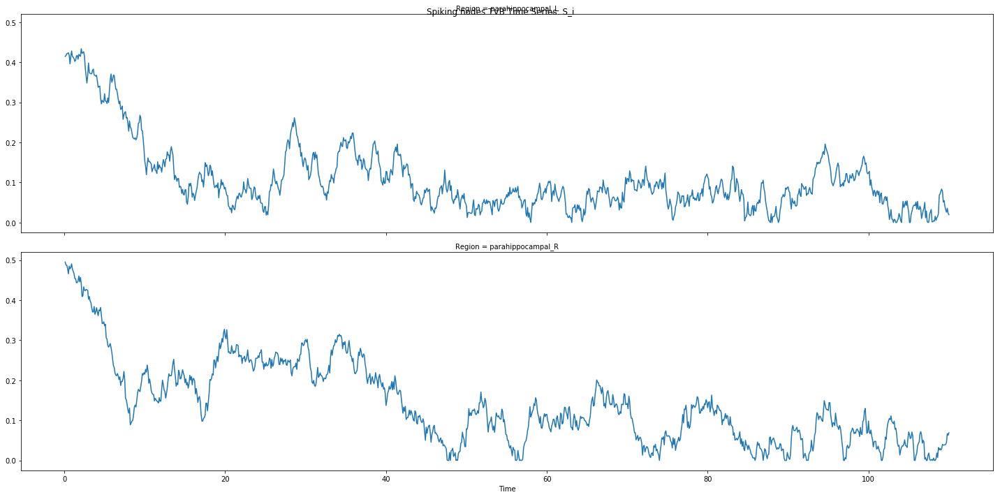

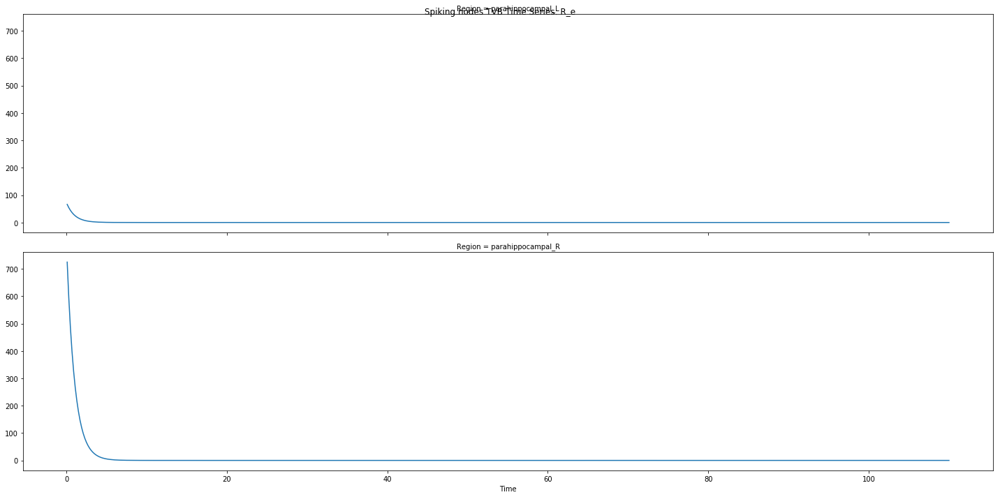

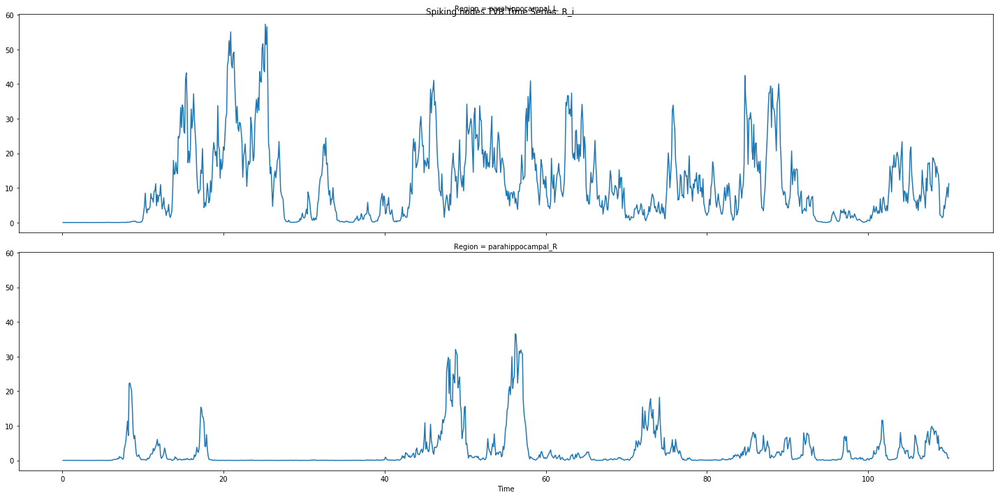

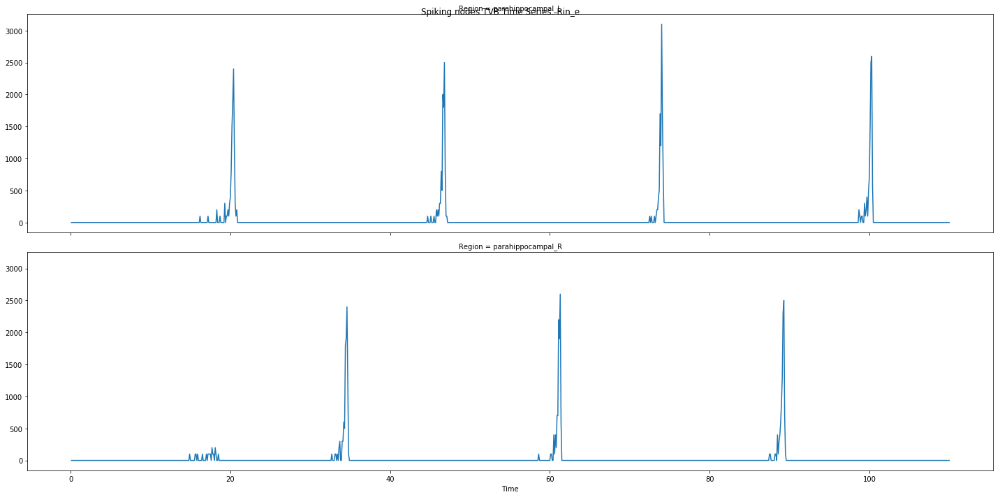

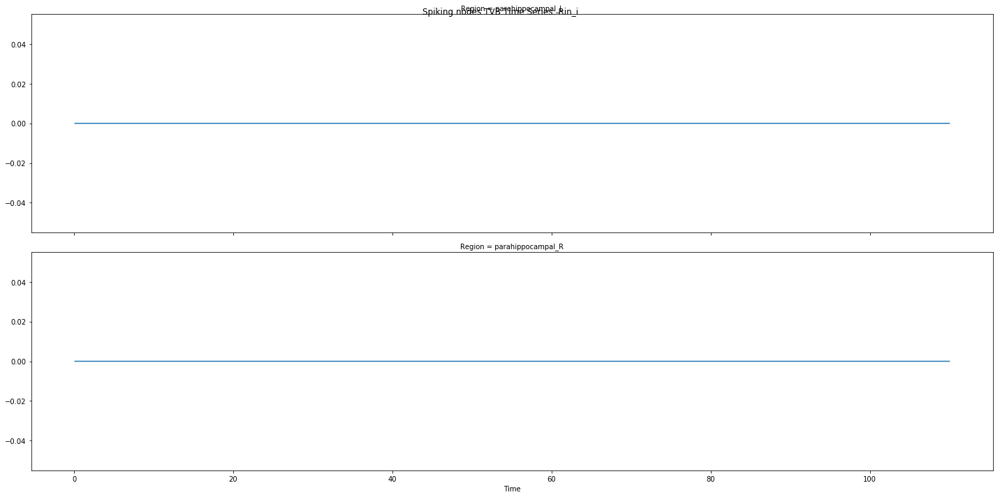

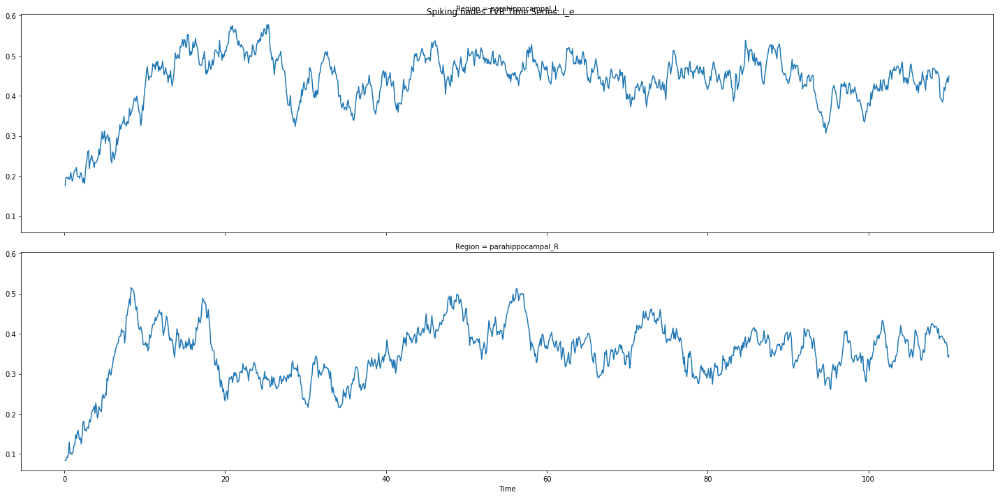

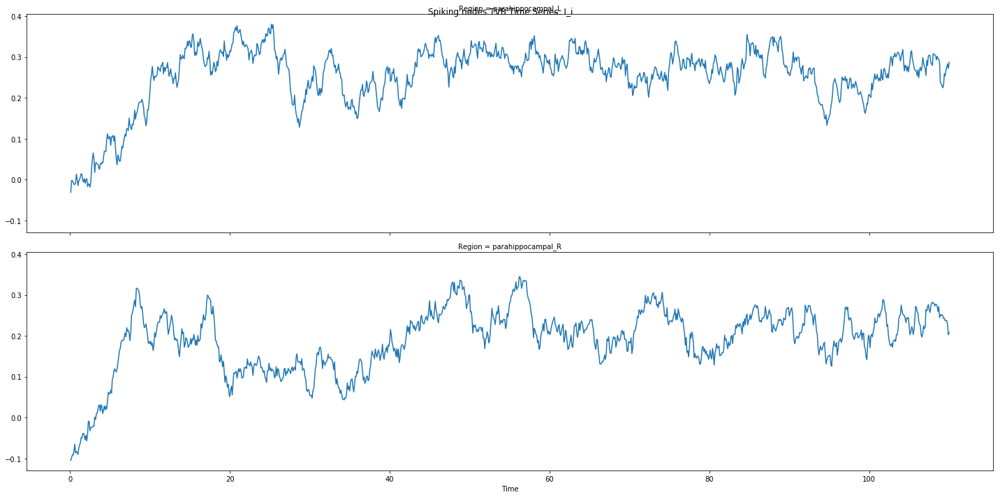

In [18]:
# Focus on the nodes modelled in NEST: 
n_spiking_nodes = len(simulator.tvb_spikeNet_interface.spiking_nodes_ids)
source_ts_nest = source_ts[:, :, simulator.tvb_spikeNet_interface.spiking_nodes_ids]
source_ts_nest.plot_timeseries(plotter_config=plotter.config, 
                               hue="Region" if source_ts_nest.shape[2] > MAX_REGIONS_IN_ROWS else None, 
                               per_variable=source_ts_nest.shape[1] > MAX_VARS_IN_COLS, 
                               figsize=FIGSIZE, figname="Spiking nodes TVB Time Series");

In [19]:
# Focus on the nodes modelled in NEST: raster plot
if source_ts_nest.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
    source_ts_nest.plot_raster(plotter_config=plotter.config, 
                               per_variable=source_ts_nest.shape[1] > MAX_VARS_IN_COLS,
                               figsize=FIGSIZE, figname="Spiking nodes TVB Time Series Raster");

### Spiking Network plots

In [20]:
from tvb_multiscale.tvb_elephant.spiking_network_analyser import SpikingNetworkAnalyser
# Create a SpikingNetworkAnalyzer:
spikeNet_analyzer = \
    SpikingNetworkAnalyser(spikeNet=nest_network,
                           start_time=source_ts.time[0], end_time=source_ts.time[-1], 
                           period=simulator.monitors[0].period, transient=transient,
                           time_series_output_type="TVB", return_data=True, 
                           force_homogeneous_results=True, connectivity=simulator.connectivity)

### Plot spikes' raster and mean spike rates and correlations

In [21]:
# Spikes rates and correlations per Population and Region
spikes_res = \
    spikeNet_analyzer.\
        compute_spikeNet_spikes_rates_and_correlations(
            populations_devices=None, regions=None,
            rates_methods=[], rates_kwargs=[{}], rate_results_names=[],
            corrs_methods=[], corrs_kwargs=[{}], corrs_results_names=[], bin_kwargs={},
            data_method=spikeNet_analyzer.get_spikes_from_device, data_kwargs={},
            return_devices=False
        );

/home/docker/env/neurosci/lib/python3.7/site-packages/elephant/conversion.py:990: UserWarning:Correcting 35 rounding errors by shifting the affected spikes into the following bin. You can set tolerance=None to disable this behaviour.
/home/docker/env/neurosci/lib/python3.7/site-packages/elephant/conversion.py:990: UserWarning:Correcting 26 rounding errors by shifting the affected spikes into the following bin. You can set tolerance=None to disable this behaviour.
/home/docker/env/neurosci/lib/python3.7/site-packages/elephant/conversion.py:990: UserWarning:Correcting 37 rounding errors by shifting the affected spikes into the following bin. You can set tolerance=None to disable this behaviour.
/home/docker/env/neurosci/lib/python3.7/site-packages/elephant/conversion.py:990: UserWarning:Correcting 22 rounding errors by shifting the affected spikes into the following bin. You can set tolerance=None to disable this behaviour.
/home/docker/env/neurosci/lib/python3.7/site-packages/elephant/c

<xarray.DataArray "Mean Populations' Spikes' Rates" (Population: 2, Region: 2)>
array([[40.54053973, 31.93193129],
       [40.44043963, 32.03203139]])
Coordinates:
  * Region      (Region) object 'parahippocampal_L' 'parahippocampal_R'
  * Population  (Population) object 'E_spikes' 'I_spikes'
<xarray.DataArray "Populations' Correlation Coefficient" (Population_i: 2, Population_j: 2, Region_i: 2, Region_j: 2)>
array([[[[ 1.        , -0.02406881],
         [-0.02406881,  1.        ]],

        [[ 0.72431274, -0.01893433],
         [-0.01772862,  0.87304215]]],


       [[[ 0.72431274, -0.01772862],
         [-0.01893433,  0.87304215]],

        [[ 1.        , -0.01381007],
         [-0.01381007,  1.        ]]]])
Coordinates:
  * Population_i  (Population_i) object 'E_spikes' 'I_spikes'
  * Region_i      (Region_i) object 'parahippocampal_L' 'parahippocampal_R'
  * Population_j  (Population_j) object 'E_spikes' 'I_spikes'
  * Region_j      (Region_j) object 'parahippocampal_L' 'parahippoc

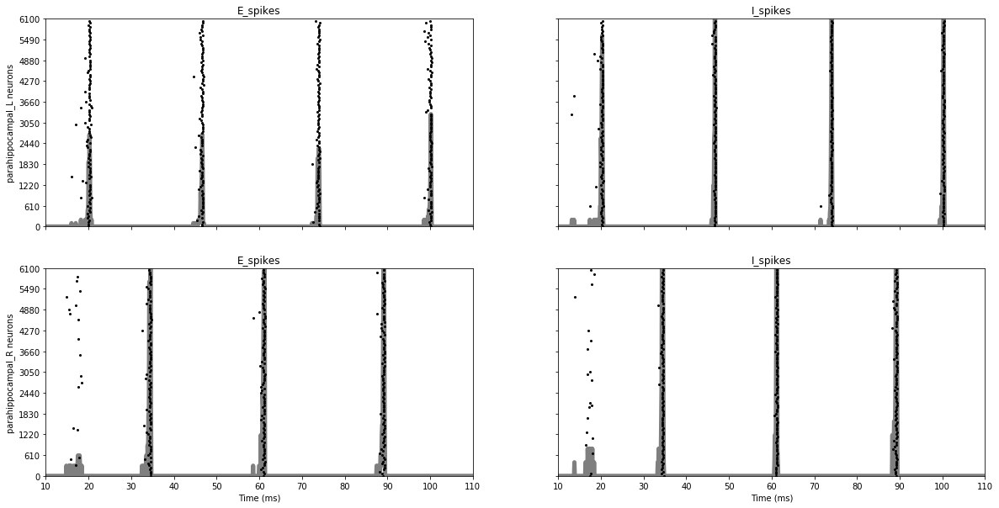

<Figure size 432x288 with 0 Axes>

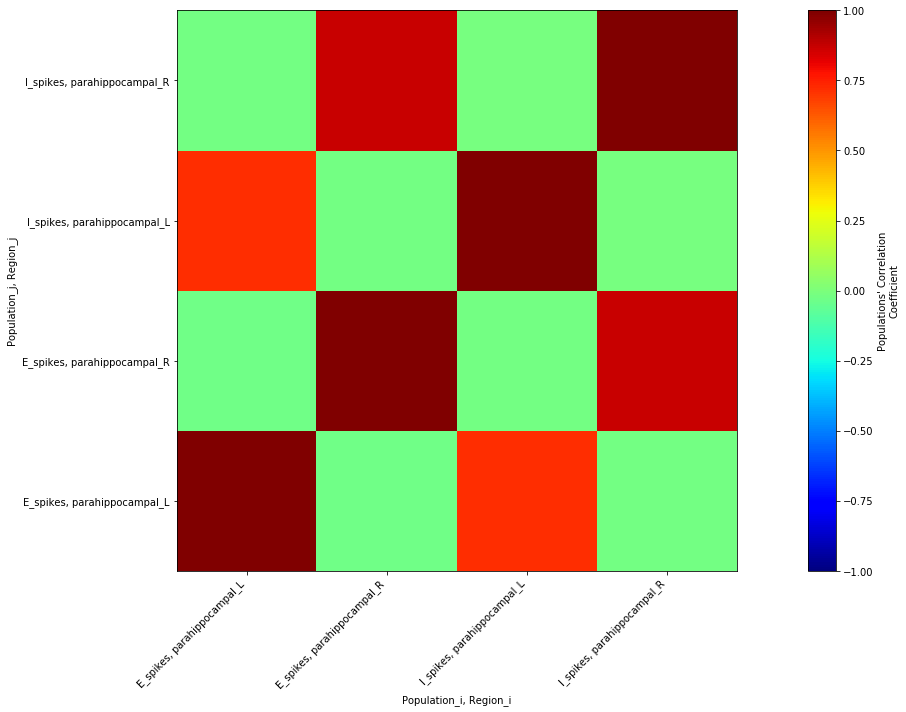

In [22]:
if spikes_res:
    print(spikes_res["mean_rate"])
    print(spikes_res["spikes_correlation_coefficient"])
    # Plot spikes' rasters together with mean population's spikes' rates' time series
    if plotter:
        plotter.plot_spike_events(spikes_res["spikes"], rates=spikes_res["mean_rate_time_series"], figsize=FIGSIZE)
        from tvb_multiscale.core.plot.correlations_plot import plot_correlations
        plot_correlations(spikes_res["spikes_correlation_coefficient"], plotter)

In [23]:
if spikes_res and writer:
    writer.write_object(spikes_res["spikes"].to_dict(), 
                        path=os.path.join(config.out.FOLDER_RES,  "Spikes") + ".h5");
    writer.write_object(spikes_res["mean_rate"].to_dict(),
                        path=os.path.join(config.out.FOLDER_RES,
                                          spikes_res["mean_rate"].name) + ".h5");
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(
                              spikes_res["mean_rate_time_series"]._data,
                               connectivity=spikes_res["mean_rate_time_series"].connectivity),
                           os.path.join(config.out.FOLDER_RES,
                                        spikes_res["mean_rate_time_series"].title) + ".h5",
                           recursive=False);
    writer.write_object(spikes_res["spikes_correlation_coefficient"].to_dict(),
                        path=os.path.join(config.out.FOLDER_RES,
                                          spikes_res["spikes_correlation_coefficient"].name) + ".h5");

2020-12-22 22:25:19,571 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/RedWongWang/res/Spikes.h5
2020-12-22 22:25:19,571 - INFO - tvb_multiscale.core.io.h5_writer - Starting to write dict to: /home/docker/packages/tvb-multiscale/docs/documented_example_notebooks/outputs/RedWongWang/res/Spikes.h5
2020-12-22 22:25:19,601 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/E_spikes/parahippocampal_L" (2 members)> dataset <class 'numpy.ndarray'> senders:
[ 25  50  15  58  23  51  66  82  22  61  40  42   7  11   5  43  39  49
  75   2   1  32  34  98   3   6  30  76   4  13  24  47  55  65  96   9
  16  26  35  48  86  93 100  46  52  60  95  18  36  53  56  57  63  64
  67  68  69  72  83  85  89  90   8  10  12  17  19  27  31  33  41  73
  94  99  14  29  37  45  54  70  74  77  78  84  88  97  20  21  38  62
  80  81  87  91  92  28  71  79  44  59  50  25

2020-12-22 22:25:19,649 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/E_spikes/parahippocampal_R" (2 members)> dataset <class 'numpy.ndarray'> senders:
[287 281 279 209 224 283 206 295 223 297 244 276 267 210 259 290 249 246
 271 225 209 248 250 222 233 284 292 207 211 266 221 286 291 216 218 239
 274 206 253 243 247 263 300 232 217 219 224 245 255 260 280 282 287 288
 294 204 234 240 241 249 268 272 230 251 262 281 283 290 212 220 228 235
 237 238 242 256 267 269 289 298 299 201 215 226 236 258 261 270 285 297
 205 208 223 227 229 231 244 246 257 264 265 273 293 295 296 202 210 252
 259 275 277 203 213 214 254 278 279 276 277 280 254 228 241 204 244 256
 218 296 230 242 209 253 234 245 263 272 284 293 205 246 252 299 201 215
 227 295 203 219 222 229 239 251 260 264 266 275 276 283 290 211 216 224
 259 282 286 288 294 300 202 210 223 238 240 257 262 265 269 281 287 207
 213 214 220 226 231 243 267 225 232 248 249 258 261 268 270 274 279 285
 206 212 2

2020-12-22 22:25:19,680 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/I_spikes/parahippocampal_L" (2 members)> dataset <class 'numpy.ndarray'> senders:
[155 164 111 184 120 181 148 130 132 183 160 177 199 108 138 144 107 125
 139 151 180 191 117 121 136 192 104 106 110 116 131 135 149 150 194 109
 119 142 154 166 182 190 196 102 115 124 126 143 146 156 157 163 167 187
 197 101 118 122 127 129 137 147 162 165 168 175 185 193 198 200 113 134
 141 164 169 170 172 173 178 186 188 189 195 105 112 114 128 133 140 145
 152 155 158 159 161 171 174 103 153 176 179 123 111 189 193 174 118 141
 164 195 150 178 194 137 145 153 160 177 182 114 117 138 142 162 175 187
 101 102 104 126 156 159 199 105 116 134 170 173 183 196 106 107 119 121
 122 124 125 129 130 139 140 143 146 148 152 154 161 163 166 180 186 188
 191 200 103 108 111 123 127 128 131 132 133 135 144 147 155 157 165 167
 168 172 176 181 184 185 190 192 198 109 110 112 113 115 120 136 149 169
 171 179 1

2020-12-22 22:25:19,708 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/I_spikes/parahippocampal_R" (2 members)> dataset <class 'numpy.ndarray'> senders:
[387 316 322 350 329 362 371 334 301 351 336 302 366 400 347 393 335 312
 319 398 383 345 353 360 304 390 302 363 308 361 378 364 397 326 387 323
 325 327 340 355 359 369 385 386 392 305 309 312 313 336 344 347 367 368
 375 306 316 317 319 320 328 329 333 334 338 339 341 350 358 374 377 379
 388 394 399 303 307 310 311 314 322 324 330 332 343 348 354 357 362 365
 370 372 376 382 395 398 315 318 335 337 342 346 349 352 356 371 373 381
 389 396 400 331 351 380 384 391 393 321 366 301 330 340 369 387 361 304
 377 305 317 302 331 301 303 337 365 373 375 382 307 316 318 321 328 333
 341 346 347 351 352 357 366 388 392 397 400 308 313 314 319 324 326 329
 332 338 355 359 372 376 379 380 384 391 395 396 399 310 322 323 325 336
 342 343 350 354 356 363 364 368 370 386 389 390 394 398 309 311 315 345
 348 358 3

2020-12-22 22:25:19,797 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2020-12-22 22:25:19,802 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to h5 file as a numpy array dataset !

2020-12-22 22:25:19,802 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to h5 file as a numpy array dataset !

2020-12-22 22:25:19,808 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Region" (2 members)> dataset <class 'numpy.ndarray'> dims:
['Region'] !

2020-12-22 22:25:19,808 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Region" (2 members)> dataset <class 'numpy.ndarray'> dims:
['Region'] !

2020-12-22 22:25:19,813 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Region" (2 members)> dataset <class 'numpy.ndarray'> data:
['parahippocampal_L' 'parahippocampal_R']

2020-12-22 22:25:20,177 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'tuple'> dims to h5 file as a numpy array dataset !

2020-12-22 22:25:20,181 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to h5 file as a numpy array dataset !

2020-12-22 22:25:20,181 - WARNING - tvb_multiscale.core.io.h5_writer - 
Writing <class 'list'> data to h5 file as a numpy array dataset !

2020-12-22 22:25:20,186 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Population_j" (2 members)> dataset <class 'numpy.ndarray'> dims:
['Population_j'] !

2020-12-22 22:25:20,186 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Population_j" (2 members)> dataset <class 'numpy.ndarray'> dims:
['Population_j'] !

2020-12-22 22:25:20,191 - WARNING - tvb_multiscale.core.io.h5_writer - 
Failed to write to <HDF5 group "/coords/Population_j" (2 members)> dataset <class 'numpy.ndarray'> data:
['E_spikes'

### Get  SpikingNetwork mean field variable time series and plot them

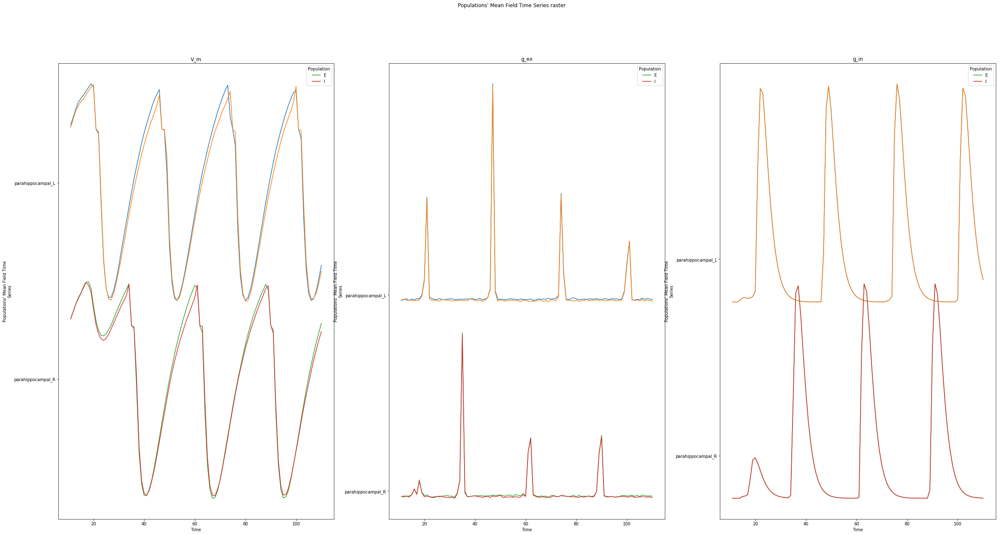

In [24]:
# Continuous time variables' data of spiking neurons
if plot_per_neuron:
    spikeNet_analyzer.return_data = True
else:
    spikeNet_analyzer.return_data = False
spikeNet_ts = \
    spikeNet_analyzer. \
         compute_spikeNet_mean_field_time_series(populations_devices=None, regions=None, variables=None,
                                                 computations_kwargs={}, data_kwargs={}, return_devices=False)
if spikeNet_ts:
    if plot_per_neuron:
        mean_field_ts = spikeNet_ts["mean_field_time_series"]  # mean field
        spikeNet_ts = spikeNet_ts["data_by_neuron"]  # per neuron data
    else:
        mean_field_ts = spikeNet_ts
        spikeNet_ts = None
    if mean_field_ts and mean_field_ts.size > 0:
        mean_field_ts.plot_timeseries(plotter_config=plotter.config, 
                                      per_variable=mean_field_ts.shape[1] > MAX_VARS_IN_COLS)
        if mean_field_ts.number_of_labels > MIN_REGIONS_FOR_RASTER_PLOT:
            mean_field_ts.plot_raster(plotter_config=plotter.config, 
                                      per_variable=mean_field_ts.shape[1] > MAX_VARS_IN_COLS,
                                      linestyle="--", alpha=0.5, linewidth=0.5)
else:
    mean_field_ts = None

In [25]:
# Write results to file:
if mean_field_ts and writer:
    writer.write_tvb_to_h5(TimeSeriesRegion().from_xarray_DataArray(
                                       mean_field_ts._data,
                                       connectivity=mean_field_ts.connectivity),
                           os.path.join(config.out.FOLDER_RES, mean_field_ts.title) + ".h5", 
                           recursive=False)

### Compute per neuron spikes' rates times series and plot them

<Figure size 432x288 with 0 Axes>

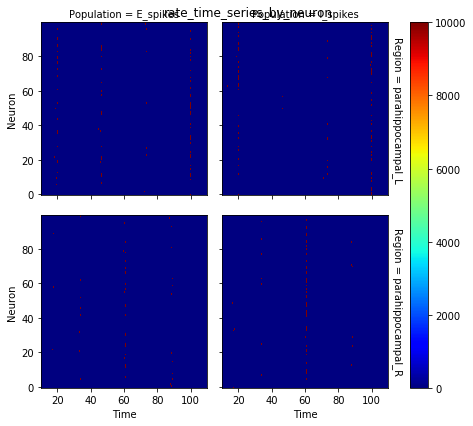

In [26]:
if spikes_res and plot_per_neuron:
    from tvb.simulator.plot.base_plotter import pyplot
    spikeNet_analyzer.return_data = False
    rates_ts_per_neuron = \
        spikeNet_analyzer. \
            compute_spikeNet_rates_time_series(populations_devices=None, regions=None,
                                               computations_kwargs={}, data_kwargs={},
                                               return_spikes_trains=False, return_devices=False);
    if rates_ts_per_neuron is not None and rates_ts_per_neuron.size:
        # Regions in rows
        row = rates_ts_per_neuron.dims[2] if rates_ts_per_neuron.shape[2] > 1 else None
        if row is None:
            # Populations in rows
            row = rates_ts_per_neuron.dims[1] if rates_ts_per_neuron.shape[1] > 1 else None
            col = None
        else:
            # Populations in columns
            col = rates_ts_per_neuron.dims[1] if rates_ts_per_neuron.shape[1] > 1 else None
        pyplot.figure()
        rates_ts_per_neuron.plot(y=rates_ts_per_neuron.dims[3], row=row, col=col, cmap="jet")
        plotter.base._save_figure(figure_name="Spike rates per neuron")
        # del rates_ts_per_neuron # to free memory

### Plot per neuron SpikingNetwork time series

<Figure size 432x288 with 0 Axes>

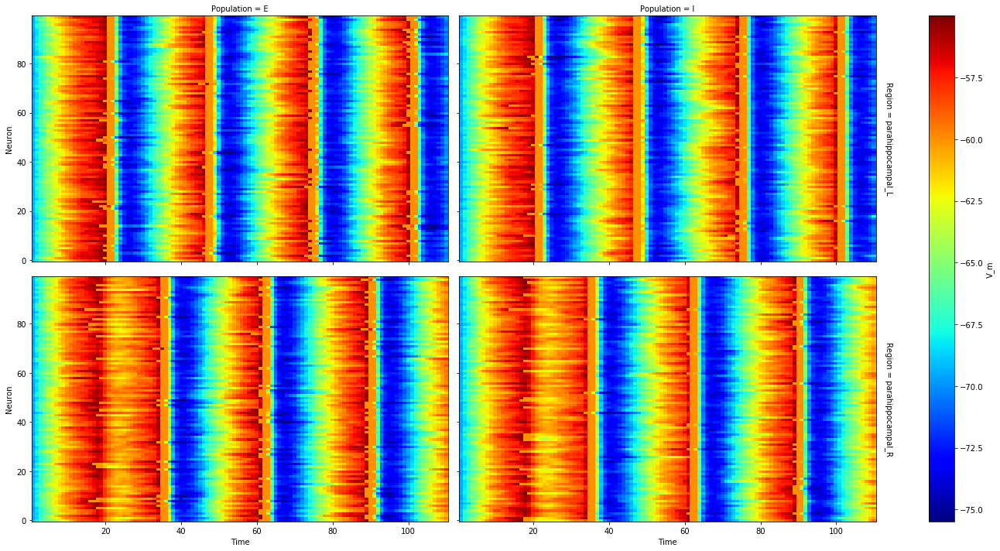

<Figure size 432x288 with 0 Axes>

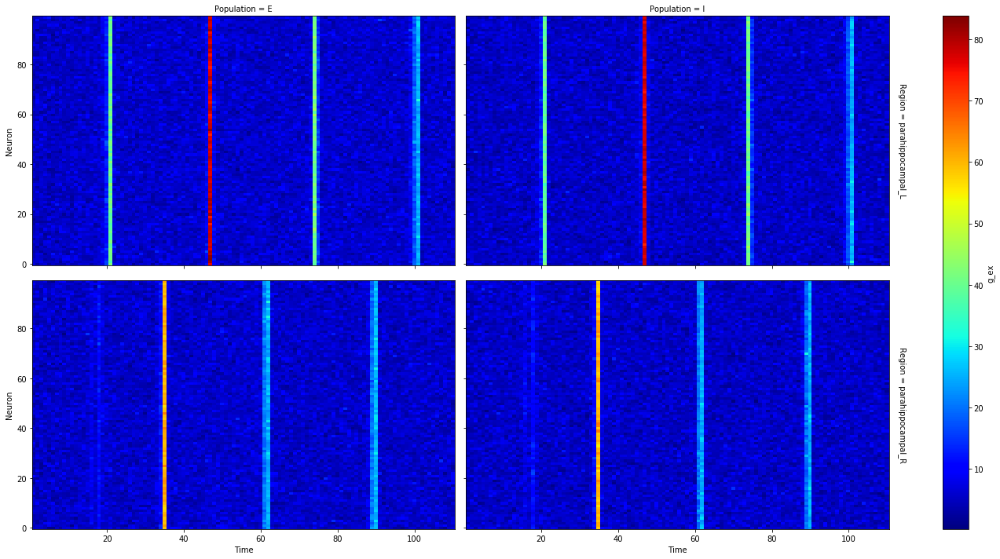

<Figure size 432x288 with 0 Axes>

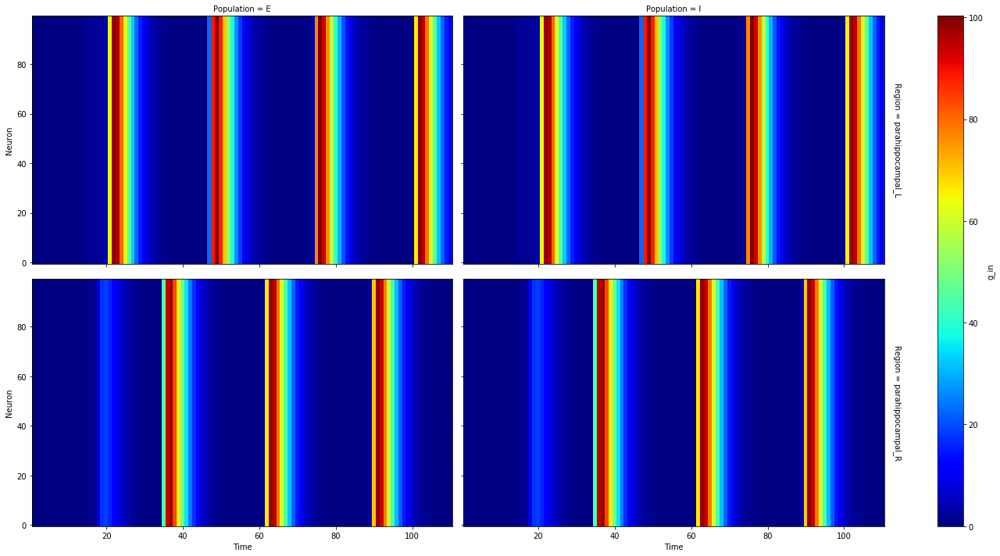

In [27]:
# Regions in rows
if spikeNet_ts is not None and spikeNet_ts.size:
    row = spikeNet_ts.dims[2] if spikeNet_ts.shape[2] > 1 else None
    if row is None:
        # Populations in rows
        row = spikeNet_ts.dims[3] if spikeNet_ts.shape[3] > 1 else None
        col = None
    else:
        # Populations in cols
         col = spikeNet_ts.dims[3] if spikeNet_ts.shape[3] > 1 else None
    for var in spikeNet_ts.coords[spikeNet_ts.dims[1]]:
        this_var_ts = spikeNet_ts.loc[:, var, :, :, :]
        this_var_ts.name = var.item()
        pyplot.figure()
        this_var_ts.plot(y=spikeNet_ts.dims[4], row=row, col=col, cmap="jet", figsize=FIGSIZE)
        plotter.base._save_figure(
            figure_name="Spiking Network variables' time series per neuron: %s" % this_var_ts.name)
    del spikeNet_ts # to free memory

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>

3 Deco Gustavo, Ponce-Alvarez Adrian, Patric Hagmann, <br>
  Gian Luca Romani, Dante Mantini,and Maurizio Corbetta. <br>
  How local Excitation-Inhibition Ratio Impacts the Whole Brain Dynamics <br>
  The Journal of Neuroscience 34(23), 7886-7898, 2014.<br>
  
4 Deco Gustavo, Ponce-Alvarez Adrian, Dante Mantini,<br>
  Gian Luca Romani, Patric Hagmann, and Maurizio Corbetta. <br>
  How local Excitation-Inhibition Ratio Impacts the Whole Brain Dynamics <br>
  The Journal of Neuroscience 33(27), 11239-11252, 2013.<br>
  
5 Meffin H, Burkitt AN, Grayden DB 2004.  <br>
  An analytical model for the large, fluctuating synaptic  <br>
  conductance state typical of neocortical neurons in vivo.  <br>
  Journal of Computational Neuroscience, 16:159-175.  <br>
  DOI: https://doi.org/10.1023/B:JCNS.0000014108.03012.81

6 Bernander O, Douglas RJ, Martin KAC, Koch C 1991.  <br>
  Synaptic background activity influences spatiotemporal  <br>
  integration in single pyramidal cells.  <br>
  Proceedings of the National Academy of Science USA, 88(24):11569-11573.  <br>
  DOI: https://doi.org/10.1073/pnas.88.24.11569

7 Kuhn A, Rotter S 2004.  <br>
  Neuronal integration of synaptic input in  <br>
  the fluctuation- driven regime.  <br>
  Journal of Neuroscience, 24(10):2345-2356. <br>
  DOI: https://doi.org/10.1523/JNEUROSCI.3349-03.2004

8 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>